# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24]
ROLL_WINDOWS = [3, 6, 12, 24]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

RANDOM_STATE = 42

# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
    f.write(f"RANDOM_STATE: {RANDOM_STATE}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/2025_12_12-21_37_07


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

# Try dropping zero, but not good
#df_dropped_zero = df_dropped_na.loc[~(df_dropped_na == 0.0).any(axis=1)]
#display(df_dropped_zero)
#df_dropped = df_dropped_zero.reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

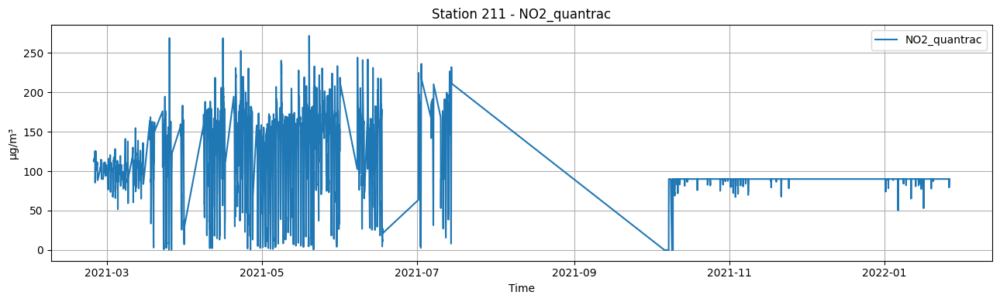

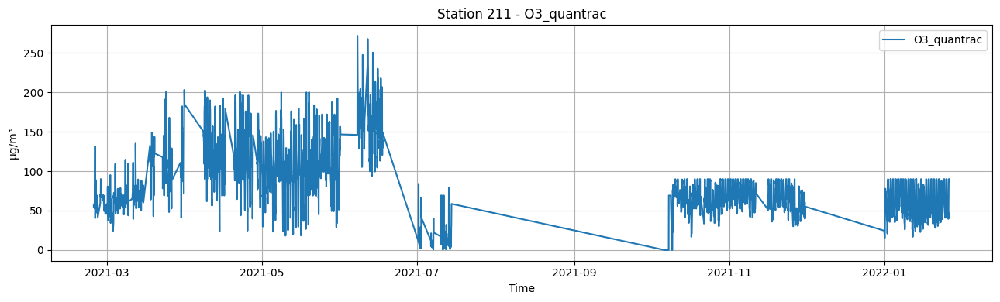

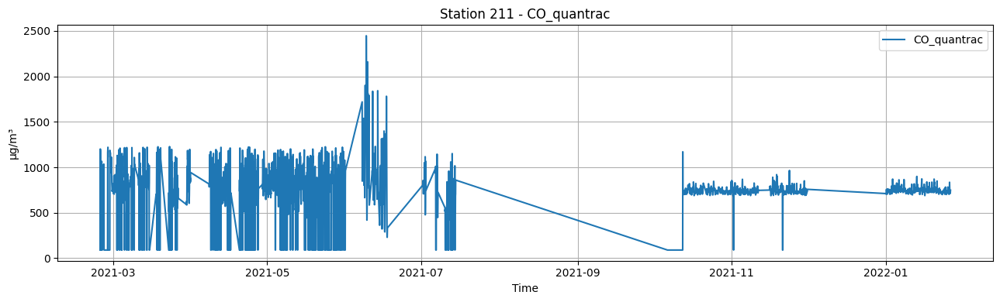

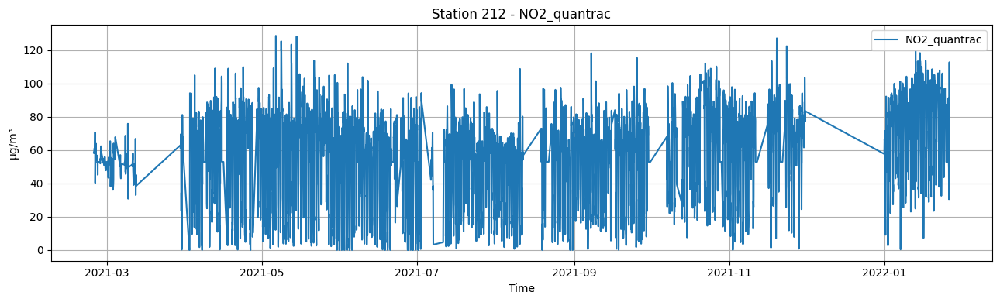

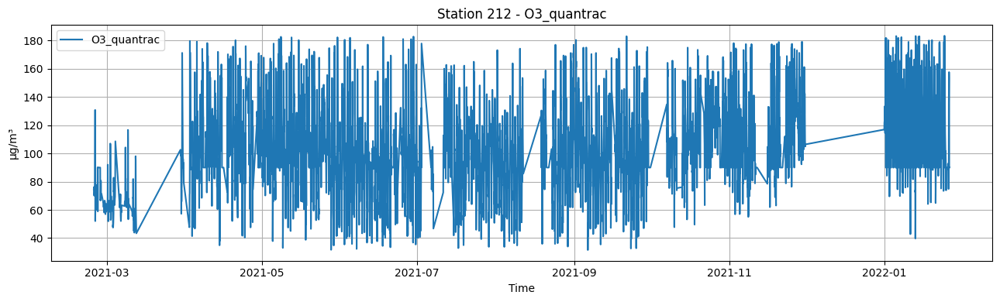

...

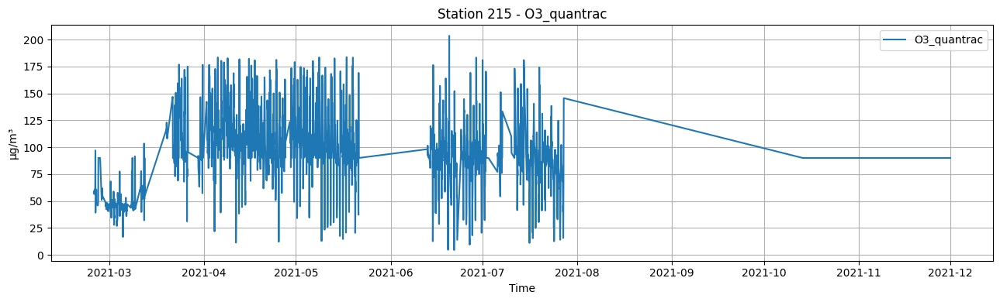

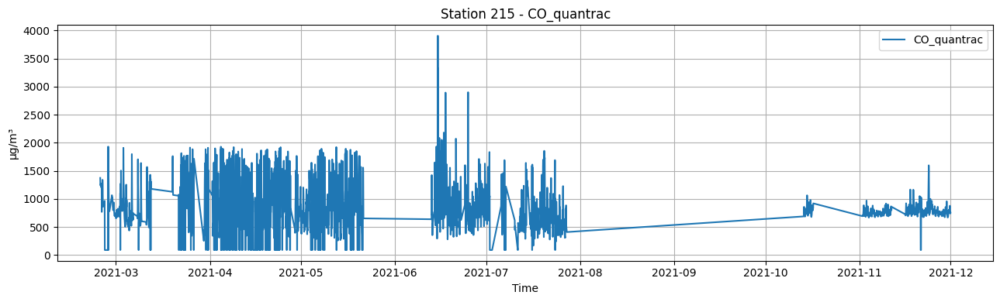

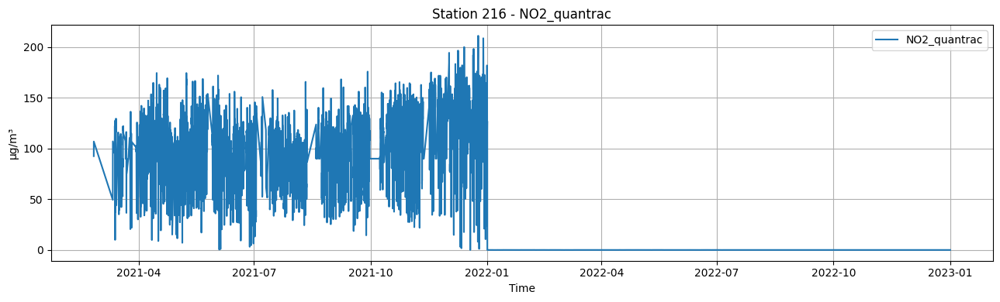

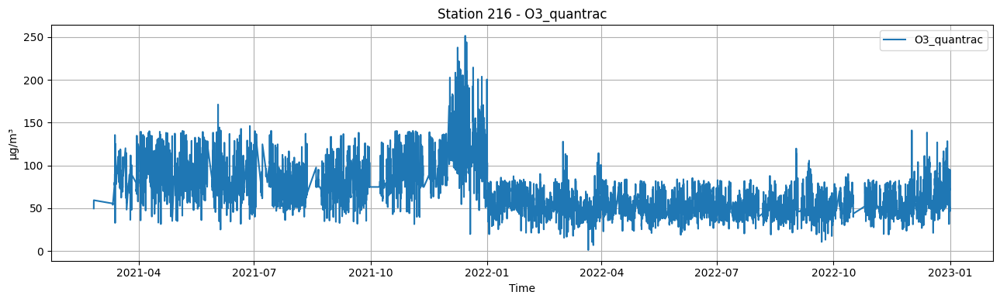

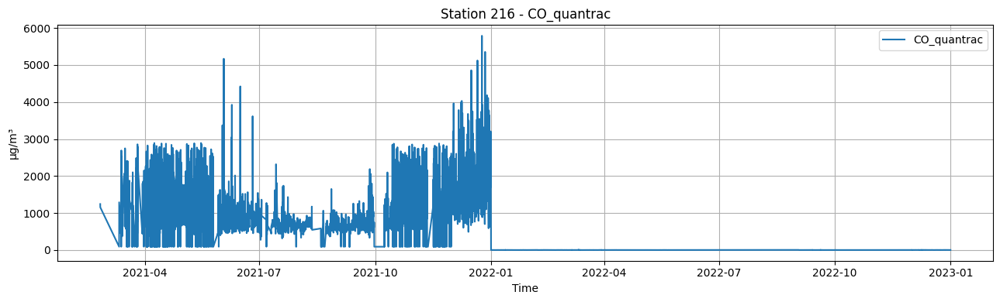

In [5]:
def plot_1_data(df, target_col, label, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df[target_col], label=label)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

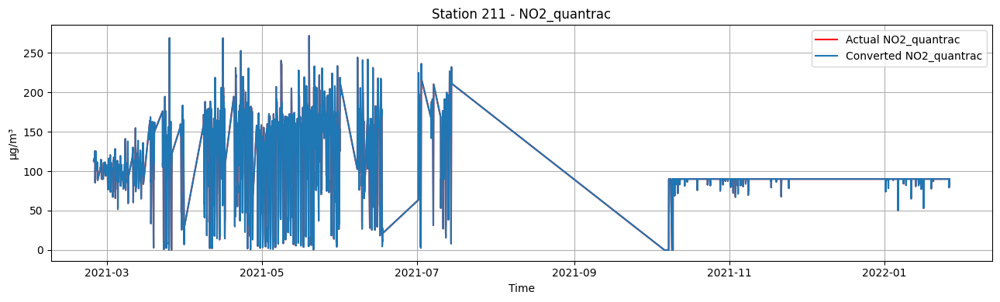

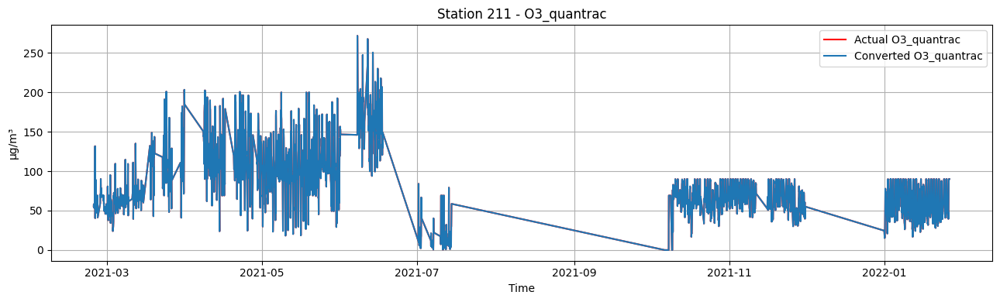

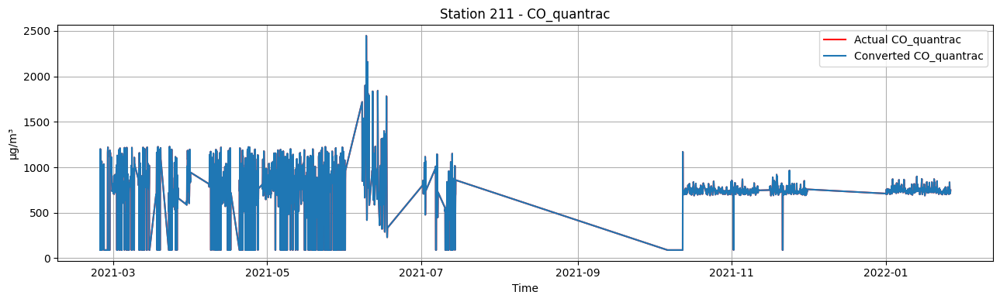

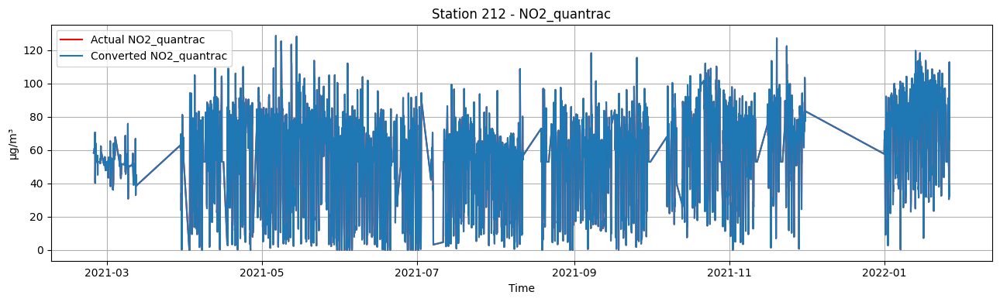

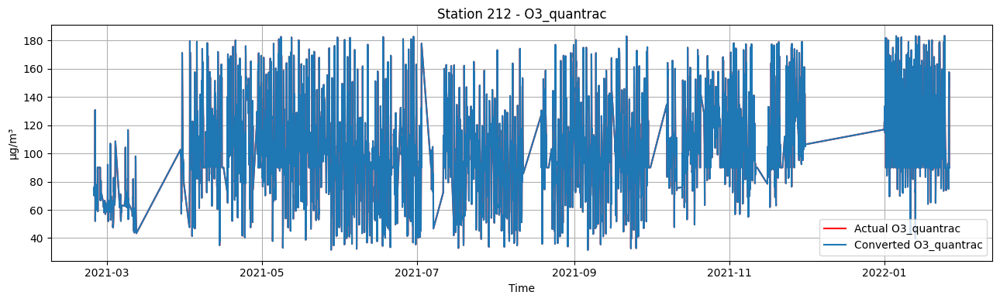

...

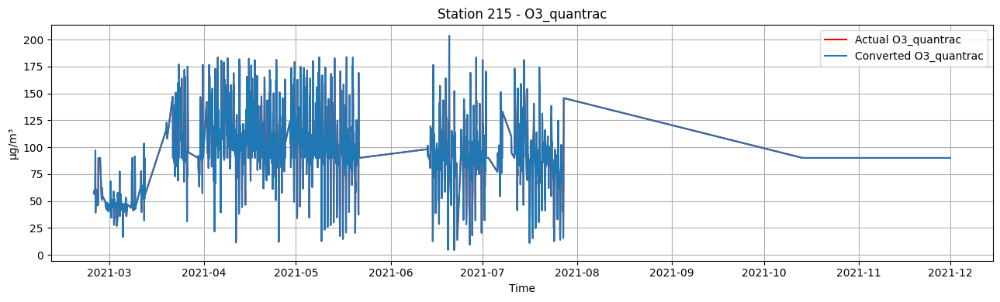

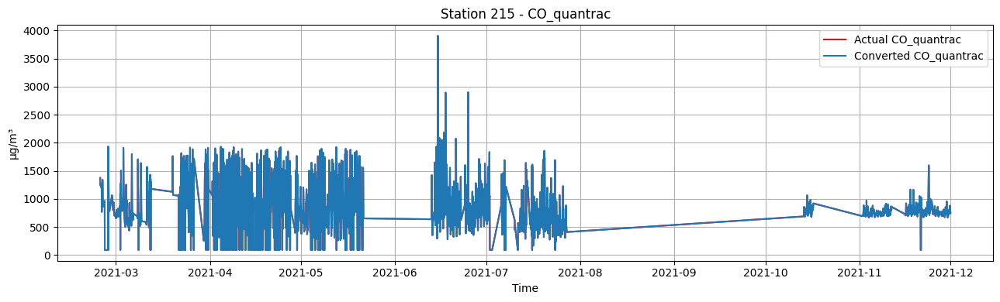

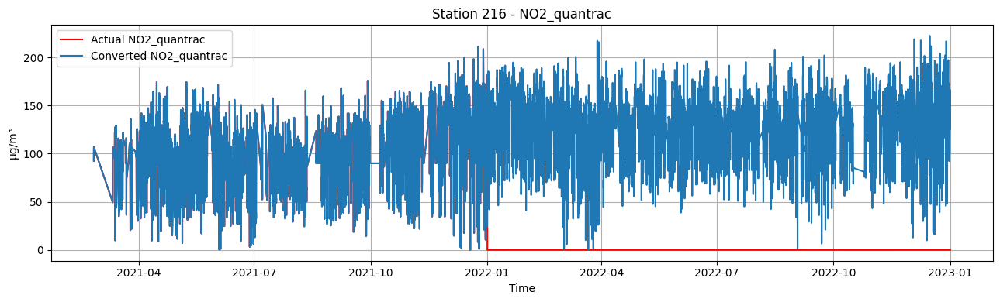

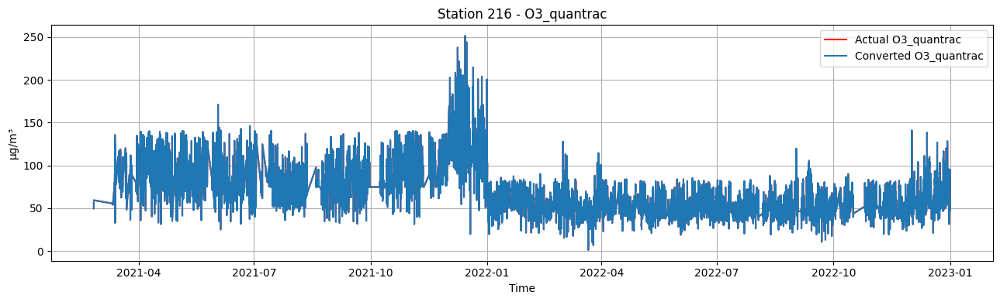

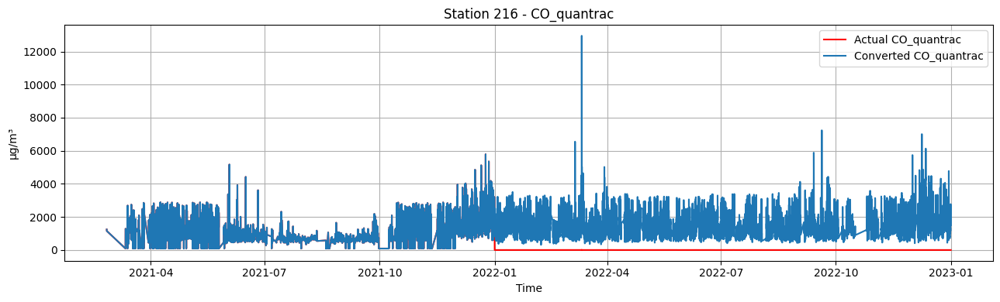

In [7]:
def plot_2_data(df1, target_col1, label1, df2, target_col2, label2, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df1[target_col1], label=label1, color="r")
    plt.plot(index, df2[target_col2], label=label2)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

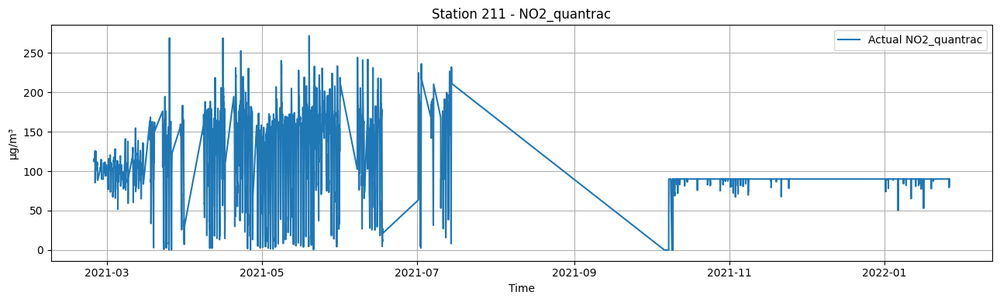

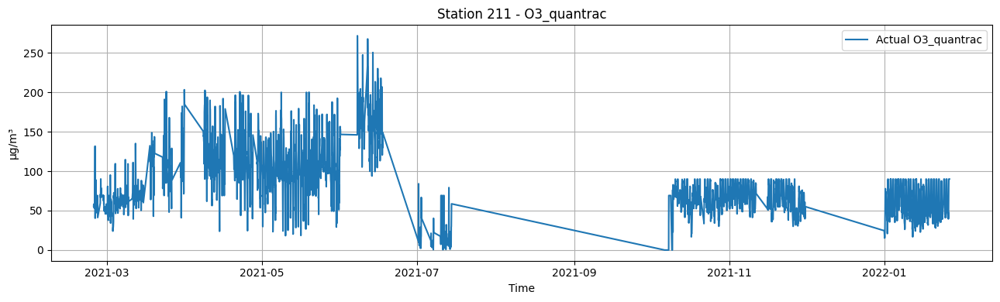

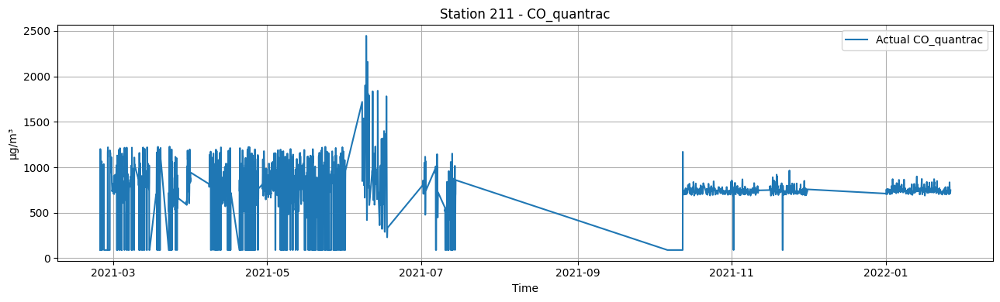

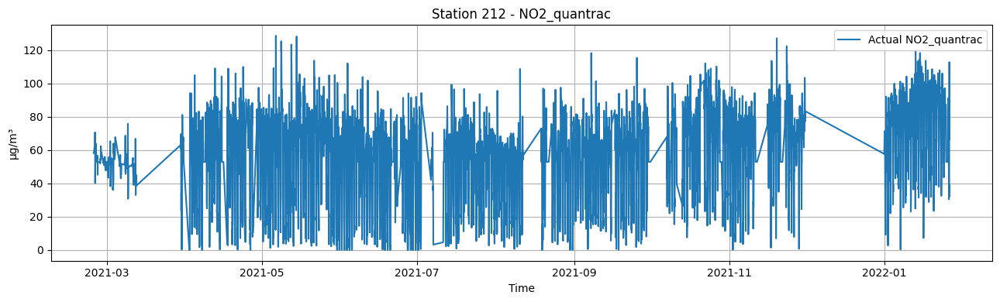

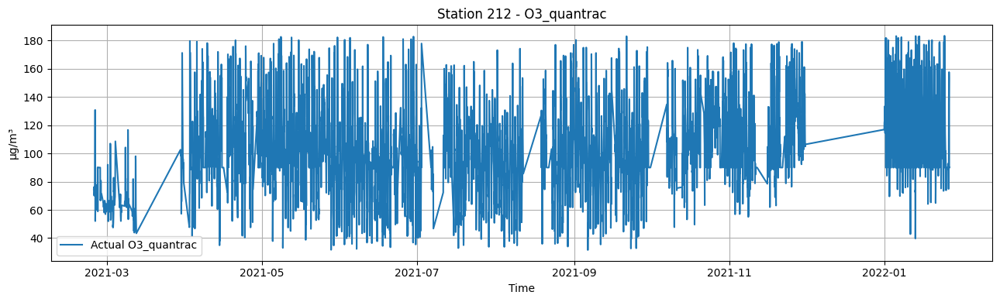

...

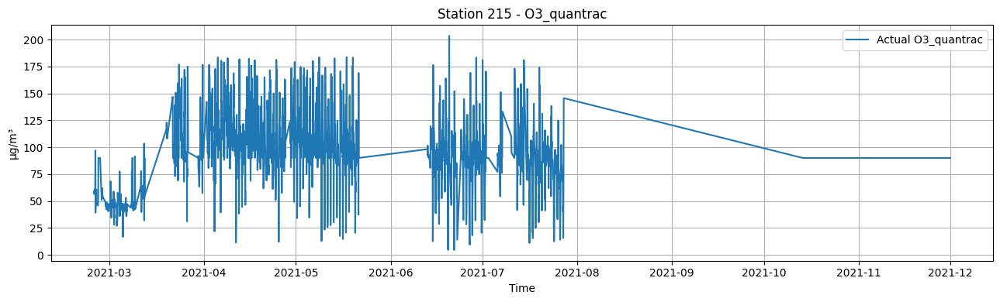

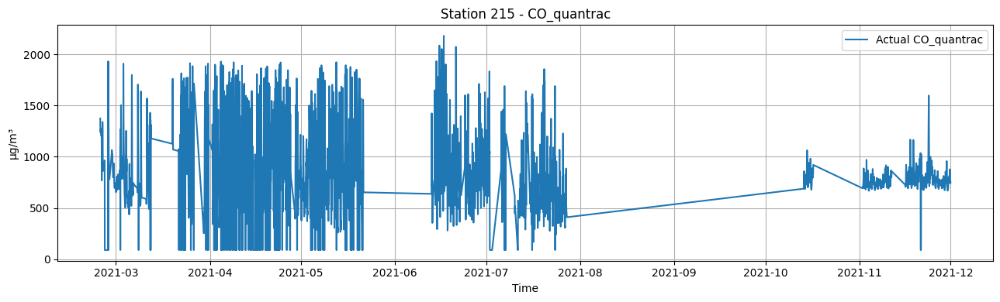

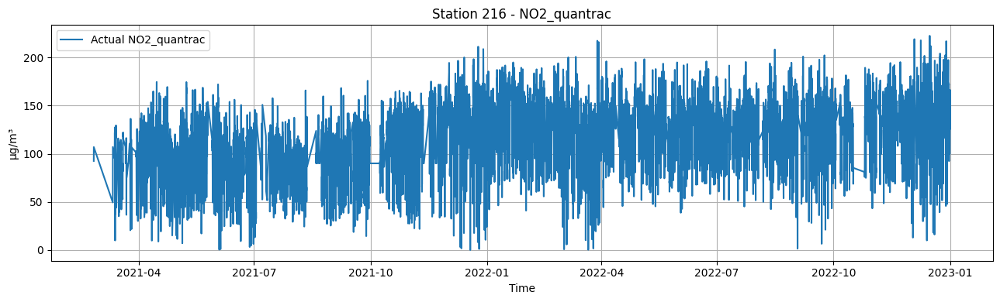

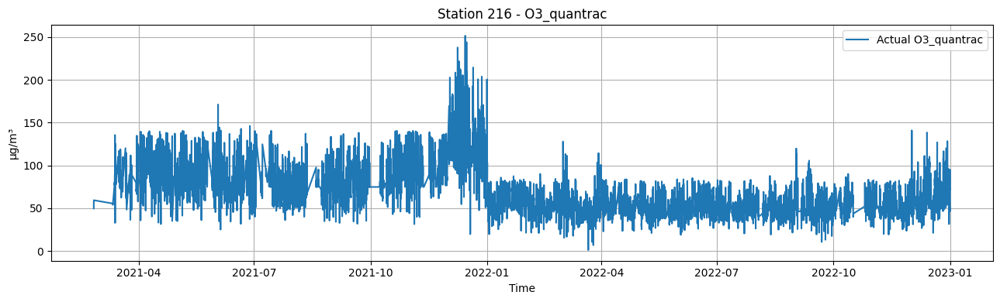

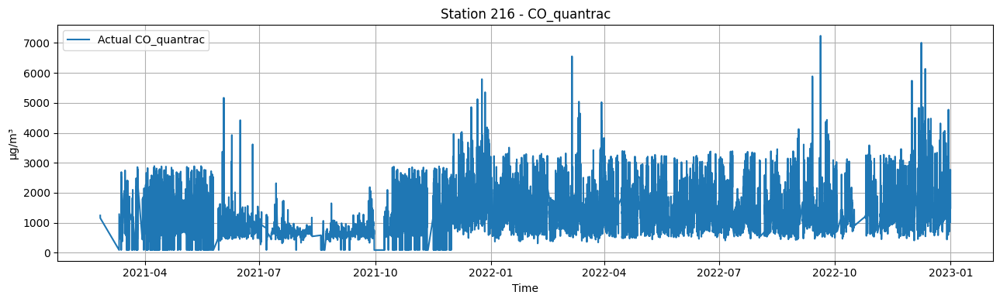

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

In [10]:
def add_time_features(df, time_col="date"):
    df = df.copy()
    df["hour"] = df[time_col].dt.hour
    df["dayofweek"] = df[time_col].dt.dayofweek
    df["month"] = df[time_col].dt.month
    return df

# Add lag features for all FEATURES including LABEL
def add_lag_features(df, group_col, target_cols, lag_steps):
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for lag in lag_steps:
            df[f"{col}_lag{lag}"] = df.groupby(group_col)[col].shift(lag)
    return df

# Just add the rolling features for LABEL
def add_rolling_features(df, group_col, target_cols, windows):
    assert isinstance(target_cols, list), "target_cols should be a list"

    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for w in windows:
            df[f"{col}_roll{w}_mean"] = (
                df.groupby(group_col)[col]
                  .shift(1) # use the past, avoid leaking
                  .rolling(window=w, min_periods=1)
                  .mean()
                  .reset_index(level=0, drop=True)
            )
            df[f"{col}_roll{w}_std"] = (
                df.groupby(group_col)[col]
                  .shift(1)
                  .rolling(window=w, min_periods=1)
                  .std()
                  .reset_index(level=0, drop=True)
            )
    return df

# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


## Build supervised from time-series

In [11]:
# Reframe past future
def build_supervised_for_horizon(df, horizon_h, target_col):
    # Sort data by station_id then date
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    # Define target_name, which is the target_col plus horizon_h hour
    target_name = f"{target_col}_t_plus_{horizon_h}h"
    df[target_name] = df.groupby("station_id")[target_col].shift(-horizon_h)

    # Dropna after shifting
    df = df.dropna().reset_index(drop=True)

    # Define label, feature and meta columns
    label_cols = [target_name]
    meta_cols = ["date", "station_id"]
    feature_cols = [c for c in df.columns if c not in label_cols + meta_cols + [target_col]]

    # Get the X, y and meta data
    X = df[meta_cols + feature_cols]
    y = df[meta_cols + label_cols]

    return X, y

# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=72, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38116, 42) (38116, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,66.7750000000,63.1880952400,112.4076778000,1.4743445750,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,65.9777777800,63.7735294100,112.4285889000,1.4743445750,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,58.9833333300,64.2050000000,111.3098444333,1.0078092718,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,60.9383333300,64.7350000000,111.3516666667,0.9874274584,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,62.8400000000,65.1883333300,110.4420333333,0.6792893386,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38111,2022-12-28 19:00:00,216,32.1633333333,89.2833333333,2518.7550666667,29.6250000000,58.0433333333,19,2,12,...,84.4116666667,63.7400000000,159.2140977778,20.8579061553,114.1846933333,53.6848505463,127.5815688889,55.7855338159,151.6327375999,46.8655510867
38112,2022-12-28 20:00:00,216,37.0300000000,116.9500000000,2530.7964666667,28.1400000000,71.9483333333,20,2,12,...,83.8816666667,69.3333333333,173.3485600000,6.8786943050,136.2809066667,46.7224623049,128.1308355556,56.2900965436,152.4330975999,47.1622431098
38113,2022-12-28 21:00:00,216,40.3850000000,120.1666666667,1990.0802666667,27.3950000000,75.8316666667,21,2,12,...,77.9366666667,69.8883333333,190.4542933333,22.8575110475,156.1695911111,52.0057979233,130.0663466667,59.0759815442,154.5608520444,48.9089019615
38114,2022-12-28 22:00:00,216,38.2166666667,105.0000000000,1664.3890666667,26.7383333333,79.2066666667,22,2,12,...,70.1150000000,72.2116666667,202.4963111111,21.0408294730,180.8552044444,30.2177513880,132.5694333333,62.0514740971,155.9693287110,50.1012964866


,date,station_id,NO2_quantrac_t_plus_72h
0,2021-02-24 21:00:00,211,105.9252333000
1,2021-02-24 22:00:00,211,106.5212000000
2,2021-02-24 23:00:00,211,107.7445000000
3,2021-02-25 00:00:00,211,104.9842333000
4,2021-02-25 01:00:00,211,103.5413667000
...,...,...,...
38111,2022-12-28 19:00:00,216,166.1610133333
38112,2022-12-28 20:00:00,216,156.7136266667
38113,2022-12-28 21:00:00,216,158.7537600000
38114,2022-12-28 22:00:00,216,125.5152800000


## Split train/validation/test for each station

In [12]:
def train_test_validation_split(X, y, train_ratio=0.7, val_ratio=0.15):
    assert (X["date"].equals(y["date"]) and X["station_id"].equals(y["station_id"])), "X and y should have the same metadata values"

    X_train, y_train, X_val, y_val, X_test, y_test = [], [], [], [], [], []
    meta_train, meta_val, meta_test = [], [], []

    meta_cols = ["date", "station_id"]
    
    for station in list(sorted(X["station_id"].unique())):
        X_station = X[X["station_id"] == station]
        y_station = y[y["station_id"] == station]
        meta = X_station[meta_cols]

        X_station = X_station.drop(columns=meta_cols)
        y_station = y_station.drop(columns=meta_cols)
    
        n = len(X_station)
        train_end = int(n * train_ratio)
        val_end = int(n * (train_ratio + val_ratio))
    
        X_train.append(X_station.iloc[:train_end])
        y_train.append(y_station.iloc[:train_end])
        meta_train.append(meta.iloc[:train_end])
    
        X_val.append(X_station.iloc[train_end:val_end])
        y_val.append(y_station.iloc[train_end:val_end])
        meta_val.append(meta.iloc[train_end:val_end])
    
        X_test.append(X_station.iloc[val_end:])
        y_test.append(y_station.iloc[val_end:])
        meta_test.append(meta.iloc[val_end:])

    X_train = pd.concat(X_train, axis=0)
    X_val = pd.concat(X_val, axis=0)
    X_test = pd.concat(X_test, axis=0)
    
    y_train = pd.concat(y_train, axis=0)
    y_val = pd.concat(y_val, axis=0)
    y_test = pd.concat(y_test, axis=0)
    
    meta_train = pd.concat(meta_train, axis=0)
    meta_val = pd.concat(meta_val, axis=0)
    meta_test = pd.concat(meta_test, axis=0)

    return (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test)

# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
3269,24.9500000000,70.5762040427,768.9851000000,27.8633333300,86.8016666700,16,0,11,90.0000000000,90.0000000000,...,94.6150000000,69.1833333300,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000
3270,29.7666666700,71.6313281685,797.4823000000,27.4000000000,88.3766666700,17,0,11,90.0000000000,90.0000000000,...,96.5050000000,83.0183333300,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000
3271,35.6333333300,75.9044129712,850.7904000000,27.1050000000,89.3166666700,18,0,11,90.0000000000,90.0000000000,...,96.3883333300,87.3733333300,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000
3272,22.5000000000,61.9614676054,749.4267000000,27.1650000000,87.7233333300,19,0,11,90.0000000000,90.0000000000,...,94.0883333300,92.0533333300,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000
3273,21.2833333300,59.1621151967,738.4824000000,26.9016666700,88.8233333300,20,0,11,90.0000000000,90.0000000000,...,90.3933333300,96.5683333300,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38111,32.1633333333,89.2833333333,2518.7550666667,29.6250000000,58.0433333333,19,2,12,135.9356533333,45.7617600000,...,84.4116666667,63.7400000000,159.2140977778,20.8579061553,114.1846933333,53.6848505463,127.5815688889,55.7855338159,151.6327375999,46.8655510867
38112,37.0300000000,116.9500000000,2530.7964666667,28.1400000000,71.9483333333,20,2,12,165.5018933333,97.4869866667,...,83.8816666667,69.3333333333,173.3485600000,6.8786943050,136.2809066667,46.7224623049,128.1308355556,56.2900965436,152.4330975999,47.1622431098
38113,40.3850000000,120.1666666667,1990.0802666667,27.3950000000,75.8316666667,21,2,12,176.2047466667,64.2171200000,...,77.9366666667,69.8883333333,190.4542933333,22.8575110475,156.1695911111,52.0057979233,130.0663466667,59.0759815442,154.5608520444,48.9089019615
38114,38.2166666667,105.0000000000,1664.3890666667,26.7383333333,79.2066666667,22,2,12,178.3390400000,135.9356533333,...,70.1150000000,72.2116666667,202.4963111111,21.0408294730,180.8552044444,30.2177513880,132.5694333333,62.0514740971,155.9693287110,50.1012964866


## Metrics

In [13]:
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    rmse = root_mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)

    # Convert zero to nan
    yt_nonzero = np.where(y_true == 0, np.nan, y_true)
    
    # MNBE
    mnbe = np.nanmean((y_true - y_pred) / yt_nonzero)

    # MAPE
    mape = np.nanmean((np.abs((y_true - y_pred) / yt_nonzero)) * 100.0)

    # Pearson r (with standard deviation check)
    if np.std(y_true) < 1e-6 or np.std(y_pred) < 1e-6:
        r = np.nan
    else:
        r = np.corrcoef(y_true.T, y_pred.T)[0, 1]

    rounded_rmse = round(rmse, 2)
    rounded_mae = round(mae, 2)
    rounded_mape = round(mape, 2)
    rounded_mnbe = round(mnbe, 2)
    rounded_r = round(r, 2)
    
    return {
        #"rmse": rmse,
        #"mae": mae,
        #"mape": mape,
        #"mnbe": mnbe,
        #"r": r,
        "rmse": rounded_rmse,
        "mae": rounded_mae,
        "mape": rounded_mape,
        "mnbe": rounded_mnbe,
        "r": rounded_r,
        "n_samples": len(y_true),
    }

# LightGBM model

## Define model

In [14]:
def train_lgbm_for_horizon(df_feat,
                           horizon_h,
                           target_col,
                           learning_rate=0.05,
                           n_estimators=2000,
                           early_stopping_rounds=100):

    # Build supervised dataset
    X, y = build_supervised_for_horizon(df_feat, horizon_h=horizon_h, target_col=target_col)

    # Split train validation test
    print(f"len(X) = {len(X)}")
    print(f"len(y) = {len(y)}")
    (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test) = train_test_validation_split(X, y)

    print(f"Number of features: {len(X_train.columns)}")
    print("Features:")
    print(*list(X_train.columns), sep="\n")
    print(f"X_train: {X_train.shape}")
    print(f"y_train: {y_train.shape}")
    print(f"X_val: {X_val.shape}")
    print(f"y_val: {y_val.shape}")
    print(f"X_test: {X_test.shape}")
    print(f"y_test: {y_test.shape}")

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Dataset cho LightGBM
    lgb_train = lgb.Dataset(X_train, label=y_train)
    lgb_val = lgb.Dataset(X_val, label=y_val, reference=lgb_train)

    params = {
        "objective": "regression",
        "metric": "rmse",
        "learning_rate": learning_rate,
        "num_leaves": 63,
        "feature_fraction": 0.9,
        "bagging_fraction": 0.8,
        "bagging_freq": 1,
        "verbosity": -1,
        "device": "cuda",
        "seed": RANDOM_STATE,
    }

    # Early stopping dùng callback (tương thích nhiều version LightGBM)
    callbacks = [
        lgb.early_stopping(stopping_rounds=early_stopping_rounds),
        lgb.log_evaluation(period=100),
    ]
    model = lgb.train(
        params,
        lgb_train,
        num_boost_round=n_estimators,
        valid_sets=[lgb_train, lgb_val],
        valid_names=["train", "val"],
        callbacks=callbacks,
    )

    # Prediction
    y_pred = np.expand_dims(model.predict(X_test, num_iteration=model.best_iteration), axis=-1)
    metrics_overall = compute_metrics(y_test, y_pred)

    # Metrics for each station
    df_test_res = meta_test.copy()
    df_test_res["y_true"] = y_test.values
    df_test_res["y_pred"] = y_pred

    rows = []
    for sid, grp in df_test_res.groupby("station_id"):
        m = compute_metrics(grp["y_true"], grp["y_pred"])
        rows.append({"station": int(sid), "horizon_h": horizon_h,**m})
    metrics_by_station = pd.DataFrame(rows)

    return model, metrics_overall, metrics_by_station, (
        X_train, y_train, X_val, y_val, X_test, y_test, meta_test
    )

## Reference

In [15]:
def plot_timeseries_example(df, model, horizon_h, station_id, target_col, n_points=300):
    # Prepare data for reference
    X, y = build_supervised_for_horizon(df, horizon_h, target_col)
    (_, _, _,
     _, _, _,
     X_test, y_test, meta_test) = train_test_validation_split(X, y)

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Get the data of station
    mask = (meta_test["station_id"] == station_id)
    X_test_sid = X_test[mask]
    y_test_sid = y_test[mask]
    meta_sid = meta_test[mask]
    if len(X_test_sid) == 0:
        print(f"No test sample for station {station_id}")
        return
    
    # Prediction
    y_pred_sid = model.predict(X_test_sid, num_iteration=getattr(model, "best_iteration", None))

    # Plotting
    X_plot = meta_sid.iloc[-n_points:]
    y_true_plot = y_test_sid.iloc[-n_points:]
    y_pred_plot = y_pred_sid[-n_points:]

    plt.figure(figsize=(14, 5))
    plt.plot(X_plot["date"], y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    plt.plot(X_plot["date"], y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    #plt.plot(X_plot.index, y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    #plt.plot(X_plot.index, y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    plt.title(f"Station {station_id} - Horizon {horizon_h}h")
    plt.xlabel("Time")
    plt.ylabel(f"{target_col} (µg/m³)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(LIGHTGBM_DIR, f"{target_col}_lightgbm_{horizon_h}h_{station_id}_{n_points}.png"))
    plt.show()

## Add time and lags features

In [16]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [17]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.drop(columns=["n_samples"]).to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====
len(X) = 38542
len(y) = 38542
Number of features: 40
Features:
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_roll6_mean
NO2_quantrac_roll6_std
NO2_quantrac_roll12_mean
NO2_quantrac_roll12_std
NO2_quantrac_roll24_mean
NO2_quantrac_roll24_std
X_train: (26976, 40)
y_train: (26976, 1)
X_val: (5782, 40)
y_val: (5782, 1)
X_test: (5784, 40)


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples
0,211,1,6.27,4.67,5.31,-0.01,0.40,588
1,211,24,5.86,4.50,5.15,-0.01,0.25,585
2,211,48,5.24,3.92,4.53,-0.01,0.18,581
3,211,72,4.68,3.37,3.91,-0.01,0.24,577
4,212,1,12.83,9.72,33.22,-0.19,0.85,875
5,212,24,16.49,12.98,42.57,-0.20,0.75,871
6,212,48,17.68,14.25,47.97,-0.26,0.67,867
7,212,72,20.50,16.89,53.14,-0.25,0.56,864
8,213,1,18.34,14.40,189.69,-1.71,0.83,887
9,213,24,22.94,18.12,263.37,-2.42,0.71,884


station_id = 211
hour = 1


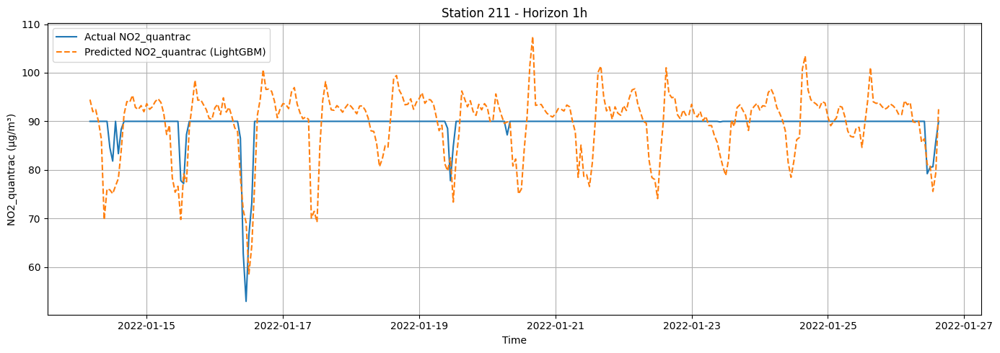

hour = 24


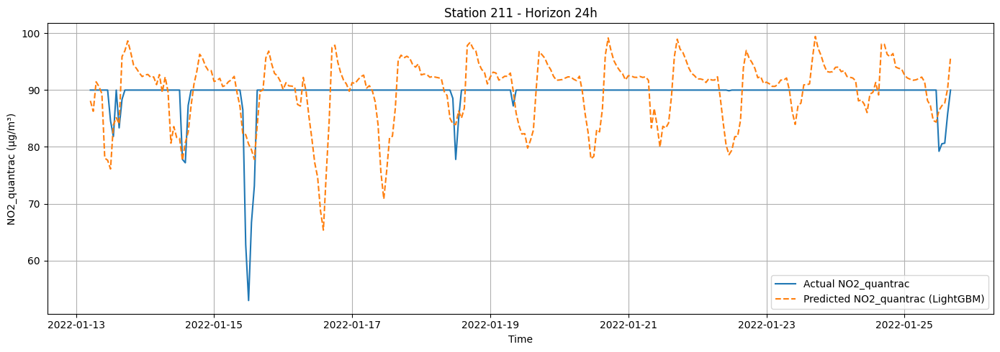

hour = 48


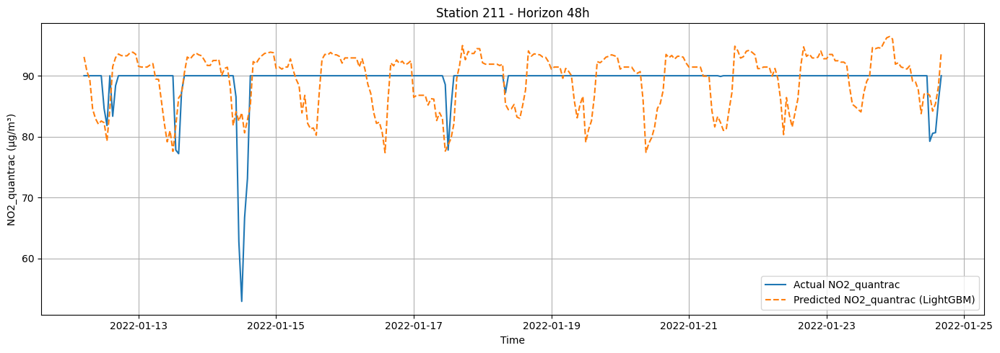

hour = 72


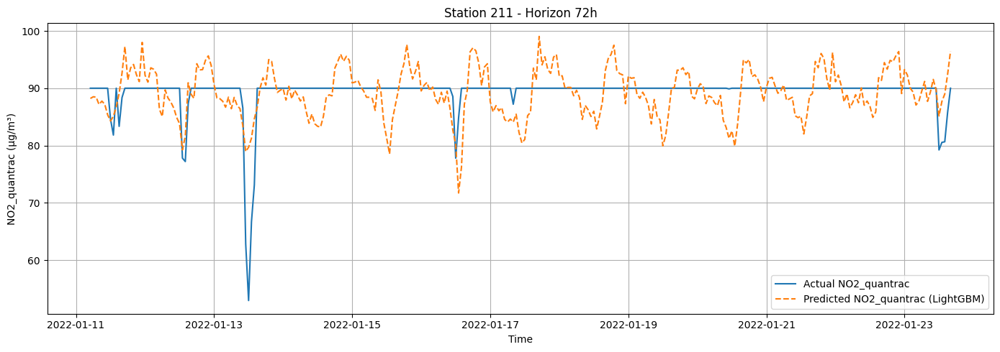

station_id = 212
hour = 1


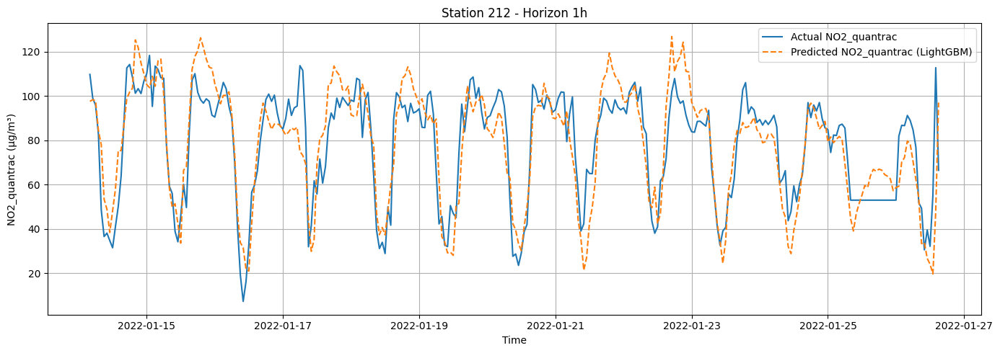

hour = 24


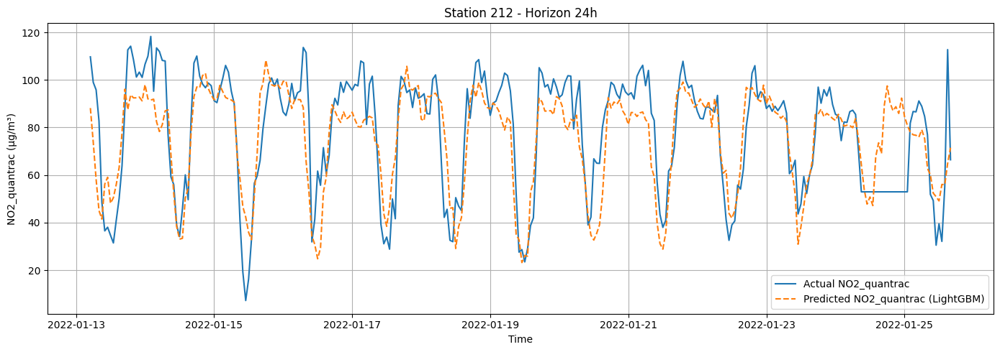

hour = 48


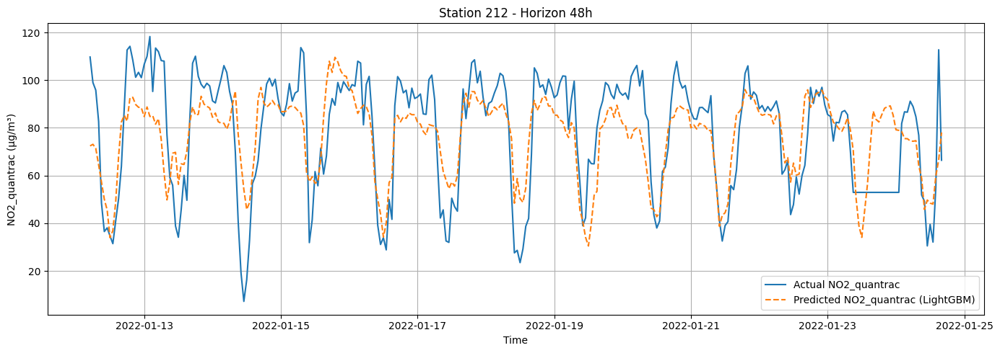

hour = 72


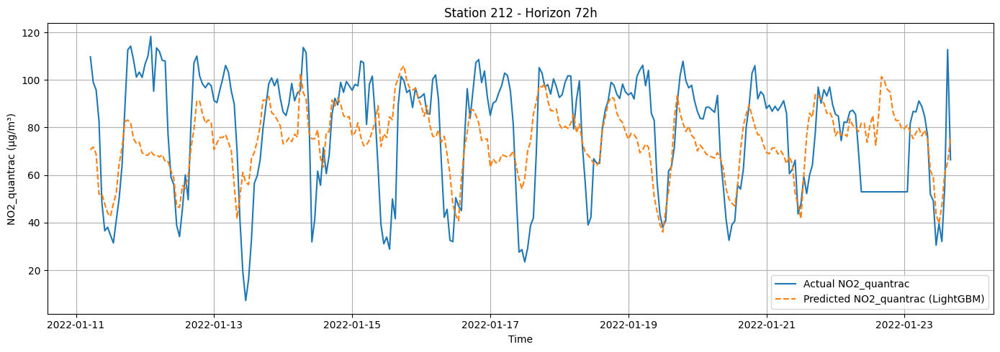

station_id = 213
hour = 1


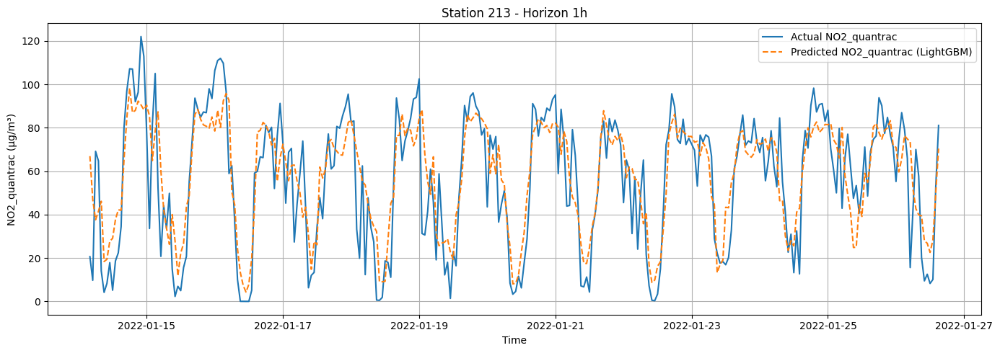

hour = 24


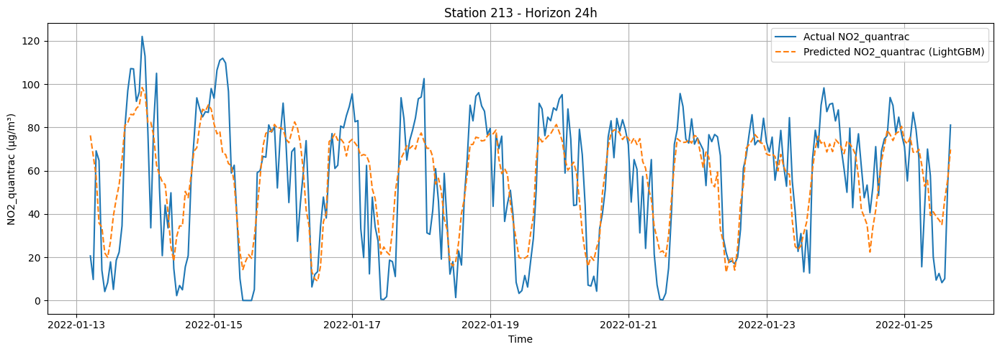

hour = 48


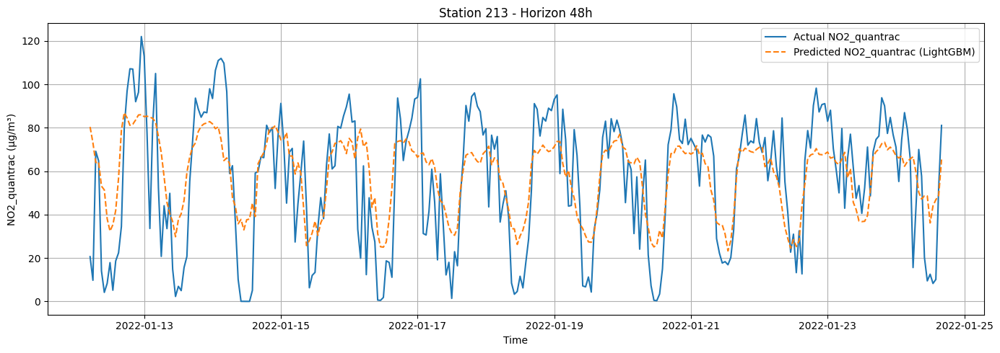

hour = 72


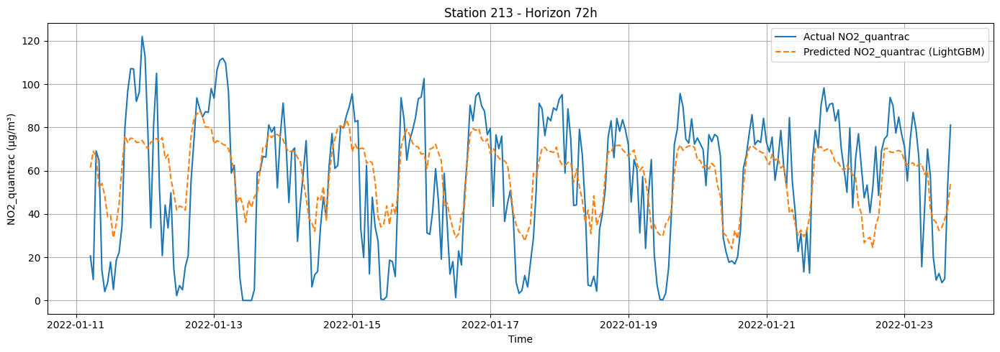

station_id = 214
hour = 1


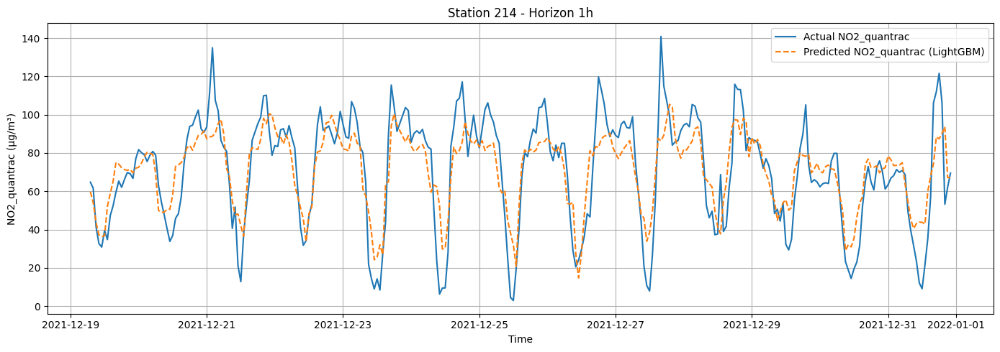

hour = 24


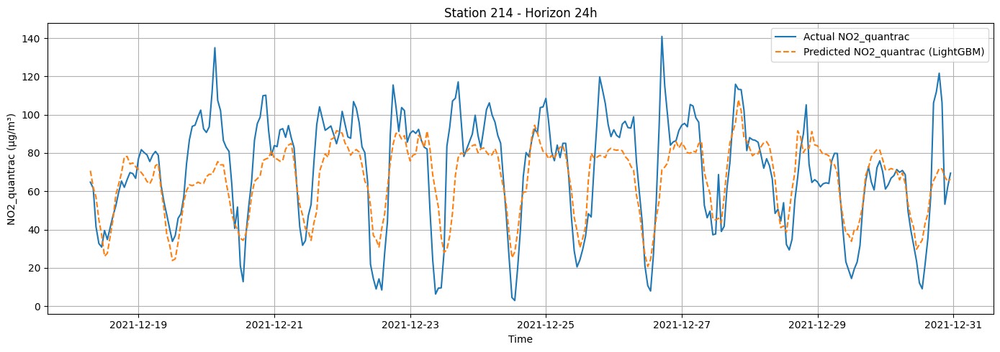

hour = 48


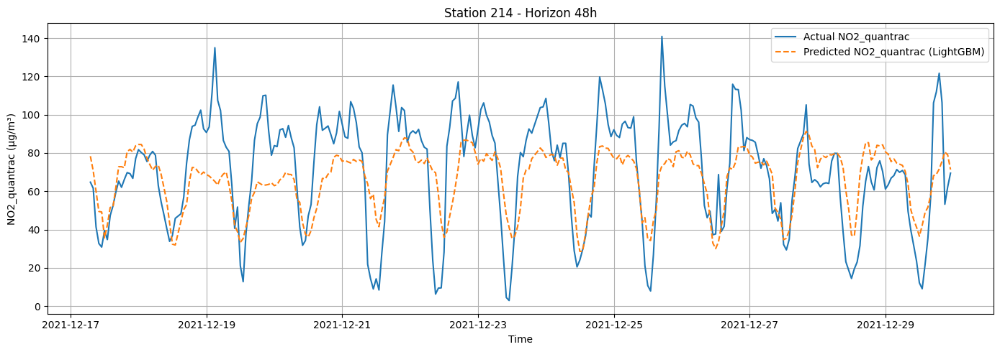

hour = 72


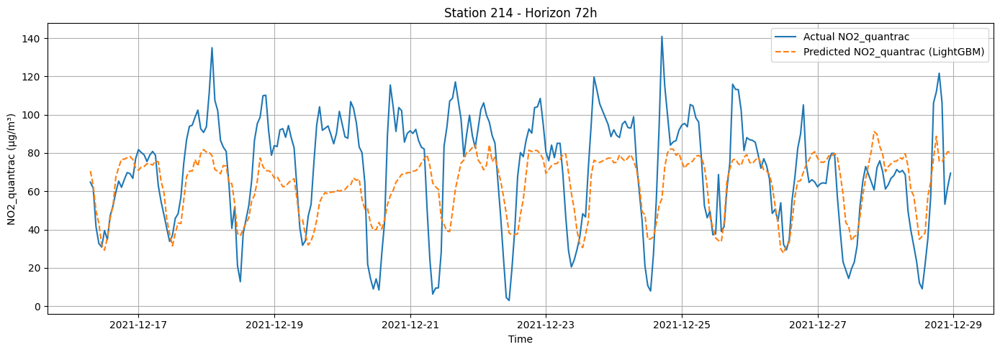

station_id = 215
hour = 1


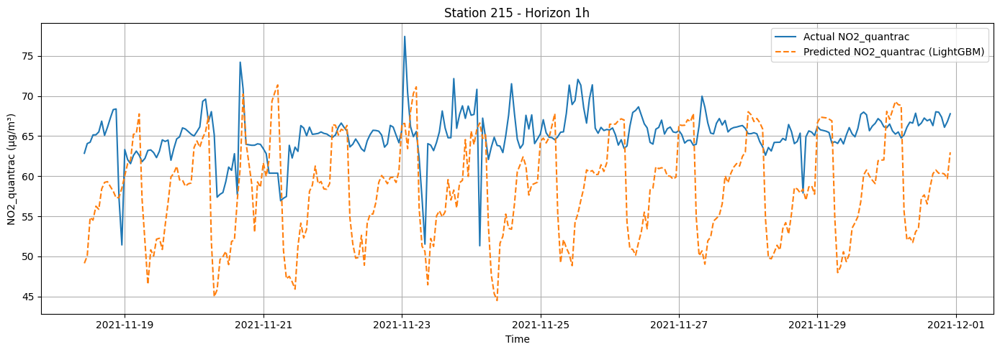

hour = 24


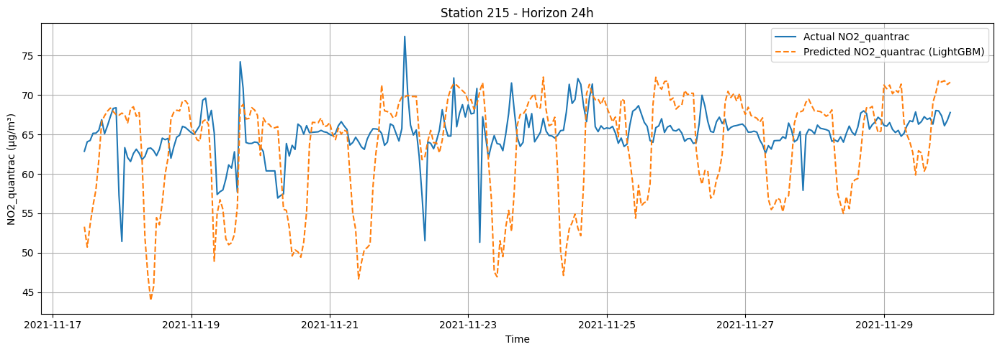

hour = 48


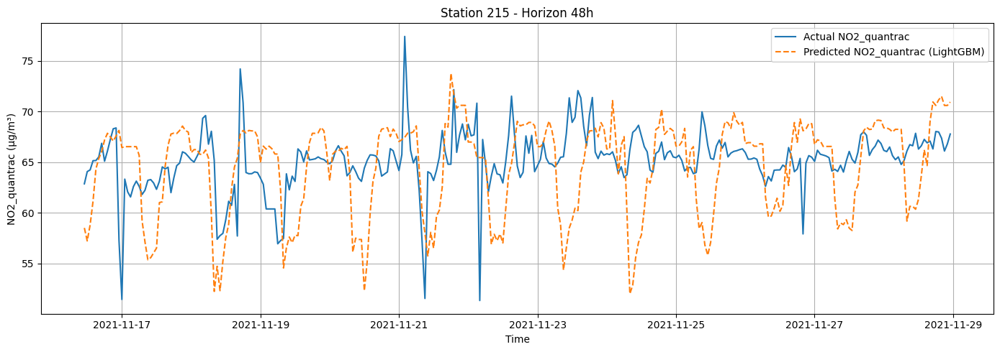

hour = 72


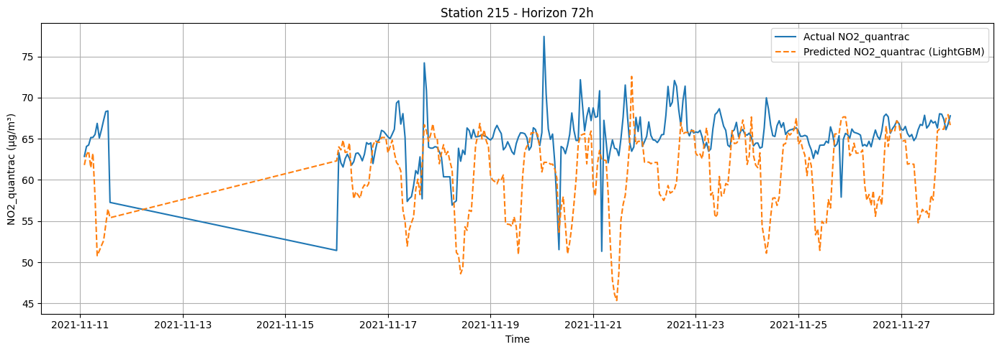

station_id = 216
hour = 1


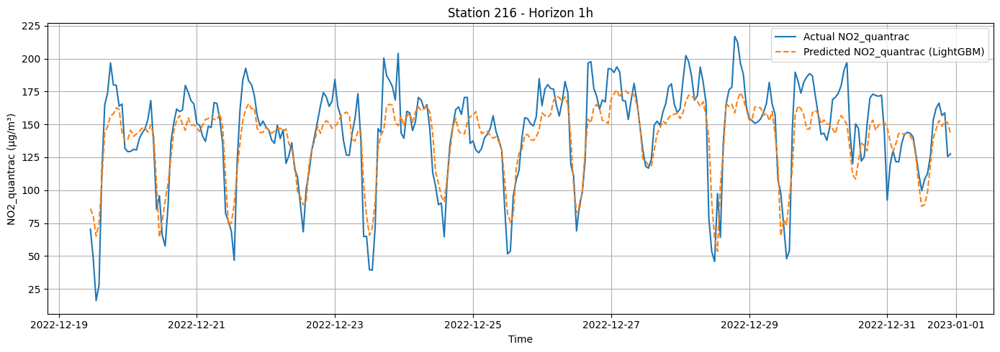

hour = 24


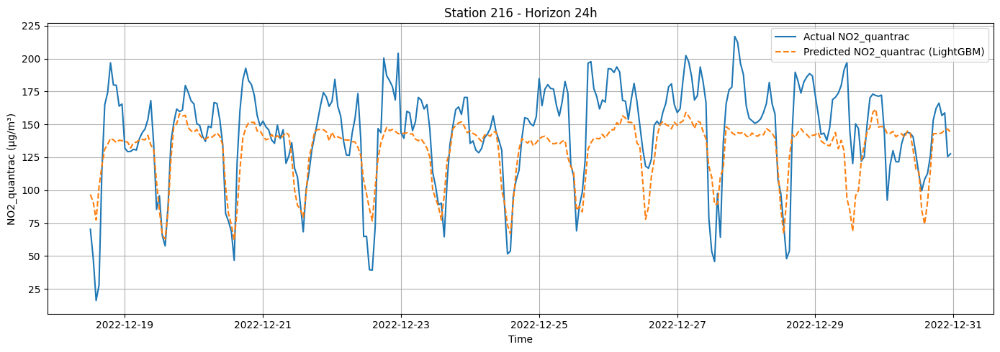

hour = 48


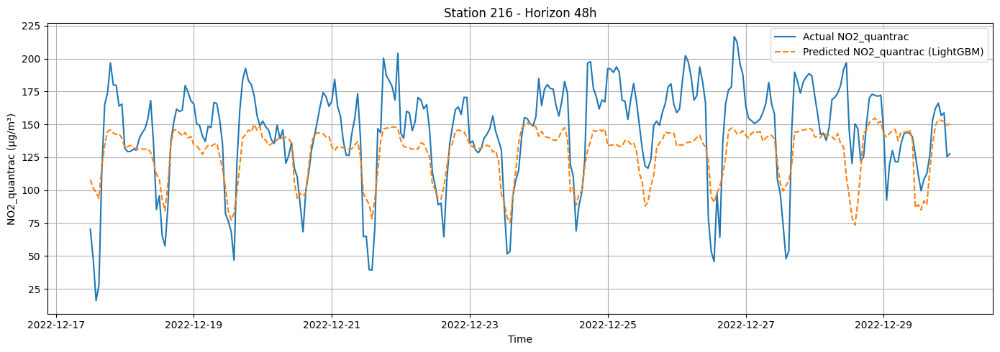

hour = 72


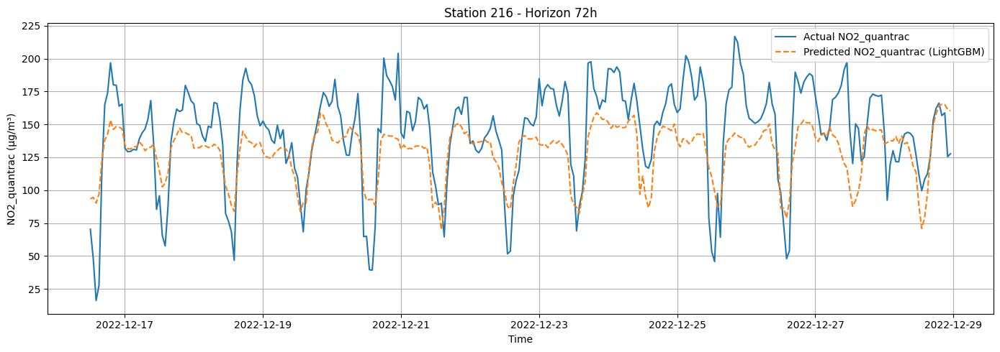

In [18]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label)

## Training for O3

In [19]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
#o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
o3_df_metrics_all.drop(columns=["n_samples"]).to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====
len(X) = 38542
len(y) = 38542
Number of features: 40
Features:
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll6_mean
O3_quantrac_roll6_std
O3_quantrac_roll12_mean
O3_quantrac_roll12_std
O3_quantrac_roll24_mean
O3_quantrac_roll24_std
X_train: (26976, 40)
y_train: (26976, 1)
X_val: (5782, 40)
y_val: (5782, 1)
X_test: (5784, 40)
y_test: 

,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples
0,211,1,12.67,10.65,20.06,-0.07,0.80,588
6,211,24,14.60,12.83,25.35,-0.11,0.76,585
12,211,48,15.75,13.99,28.18,-0.14,0.77,581
18,211,72,17.53,14.99,27.43,-0.07,0.66,577
1,212,1,27.57,20.46,18.19,-0.02,0.34,875
7,212,24,29.47,23.75,20.08,0.03,0.20,871
13,212,48,28.62,23.04,19.58,0.02,0.23,867
19,212,72,32.05,25.46,20.39,0.09,0.18,864
2,213,1,27.17,21.43,62.85,-0.44,0.63,887
8,213,24,30.98,25.01,76.60,-0.56,0.46,884


station_id = 211
hour = 1


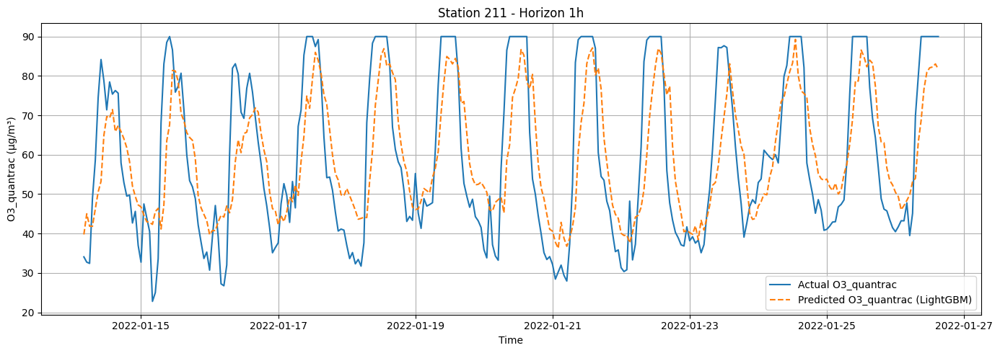

hour = 24


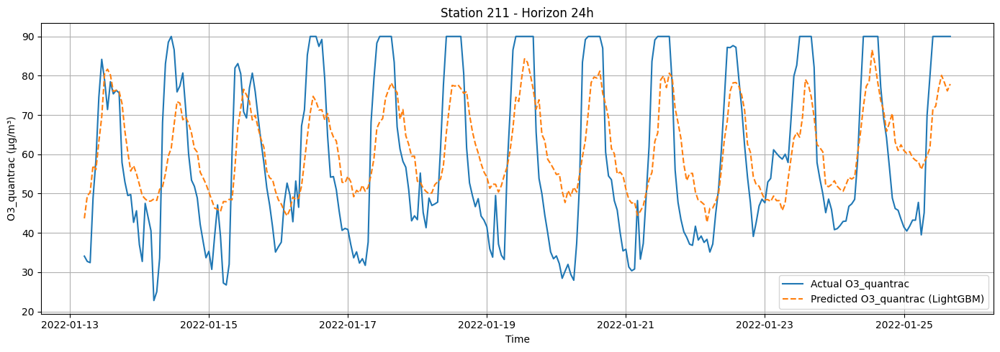

hour = 48


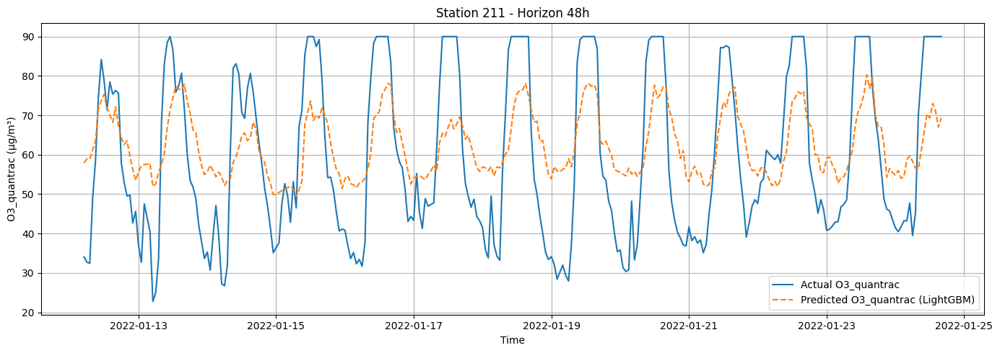

hour = 72


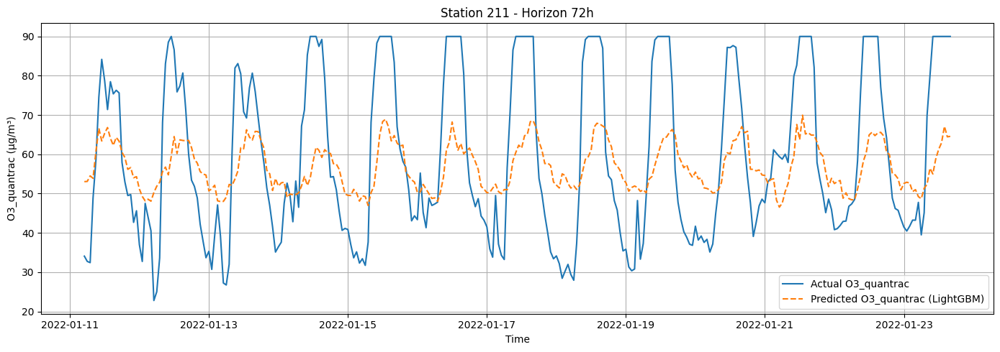

station_id = 212
hour = 1


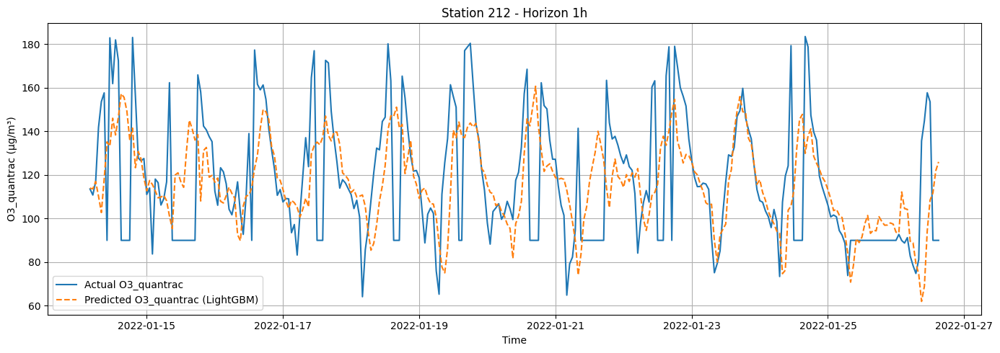

hour = 24


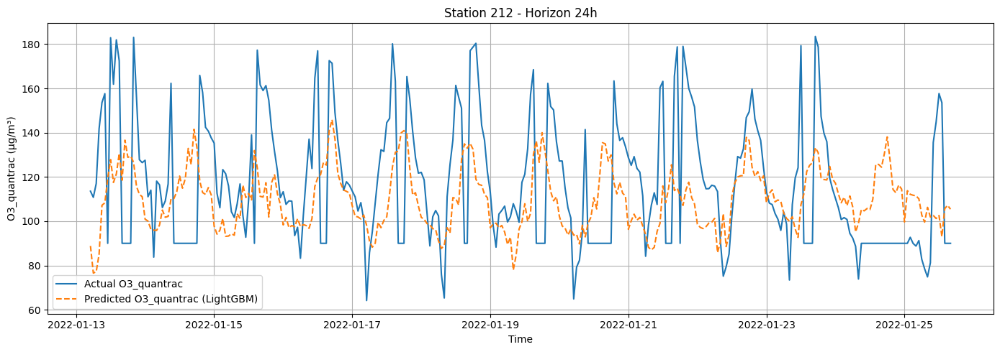

hour = 48


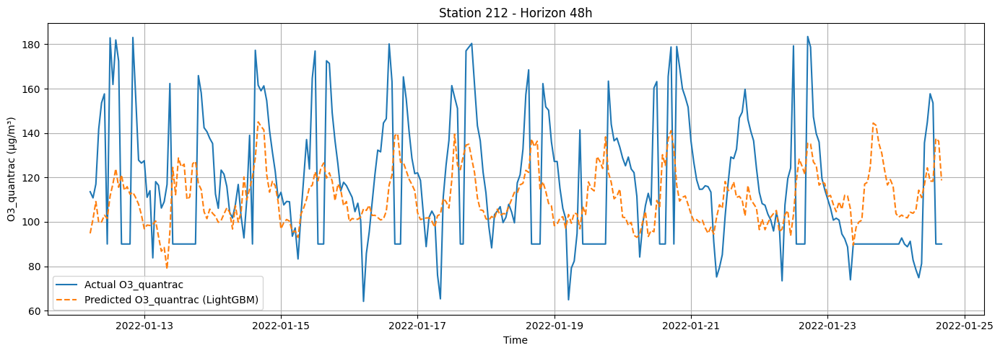

hour = 72


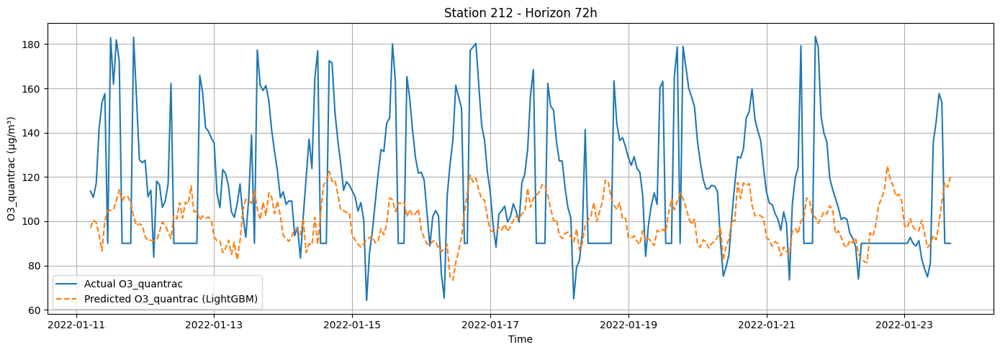

station_id = 213
hour = 1


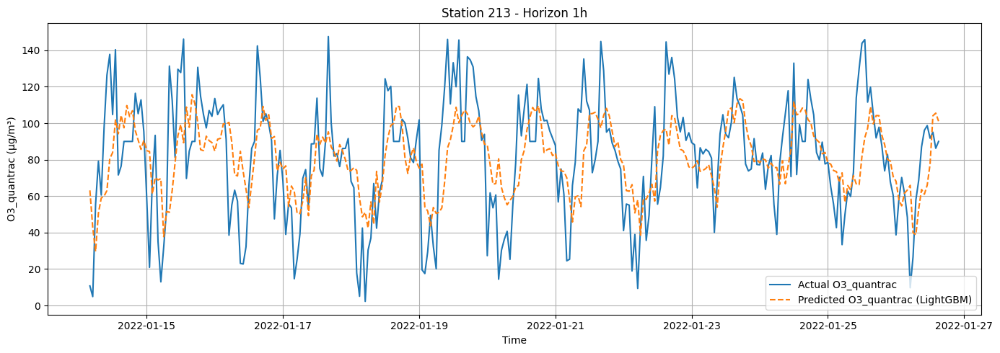

hour = 24


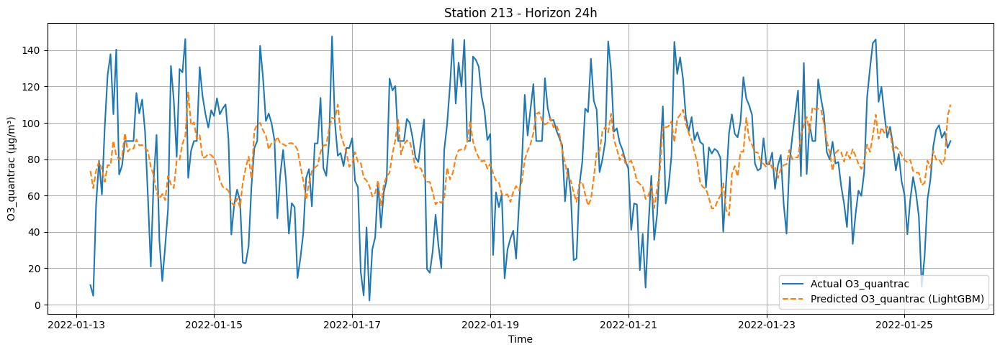

hour = 48


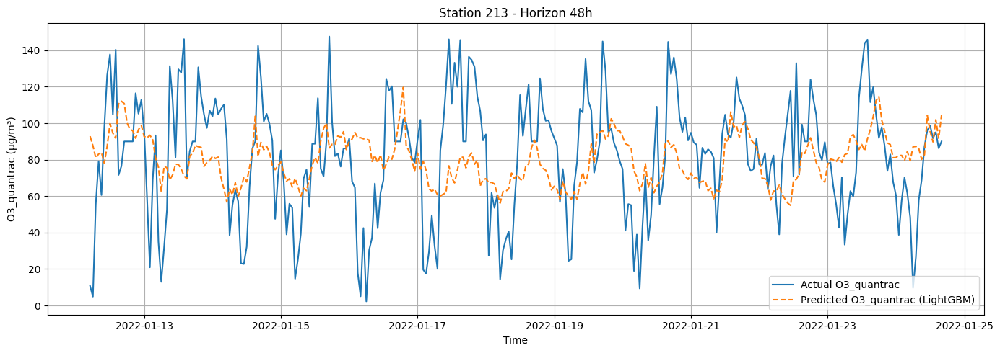

hour = 72


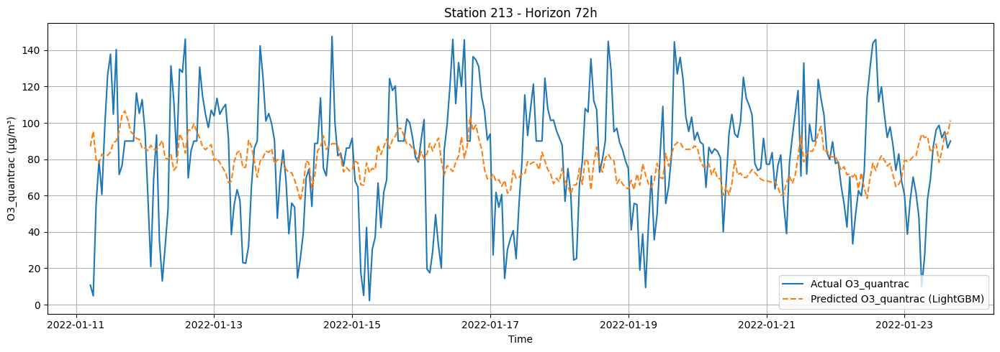

station_id = 214
hour = 1


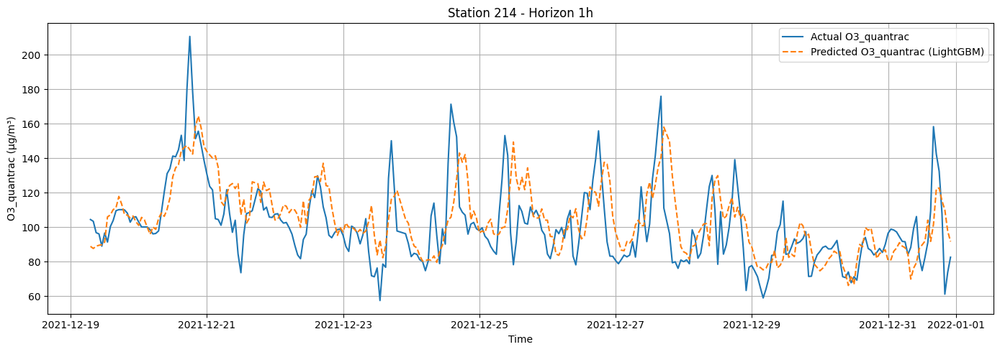

hour = 24


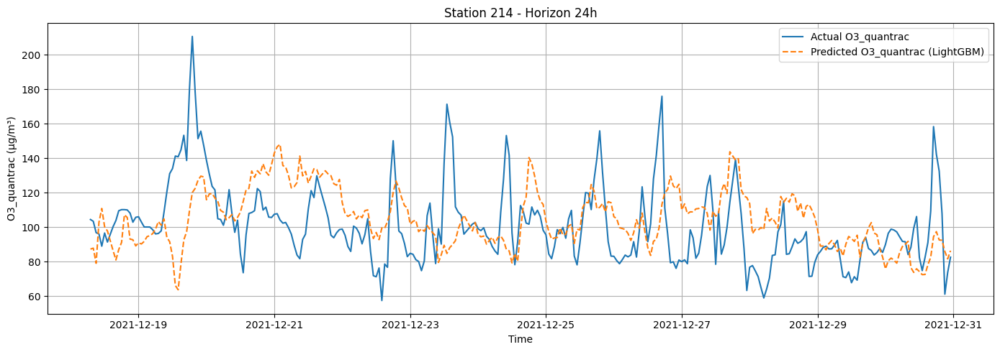

hour = 48


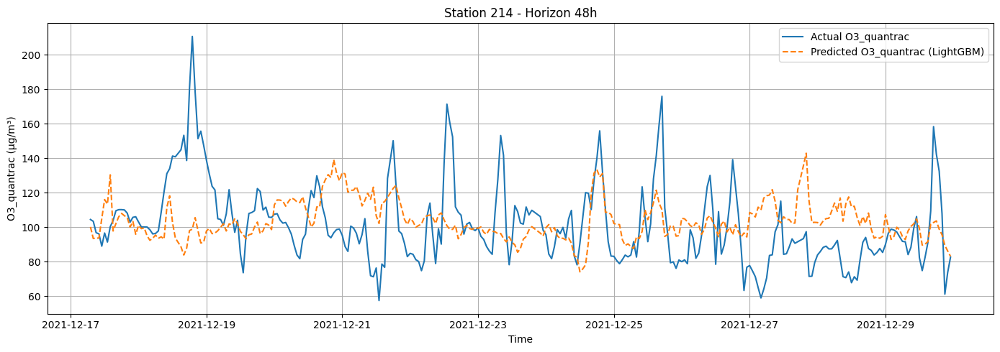

hour = 72


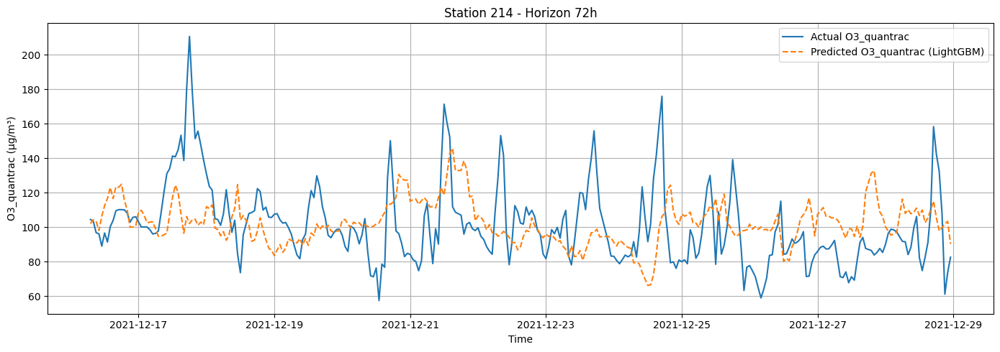

station_id = 215
hour = 1


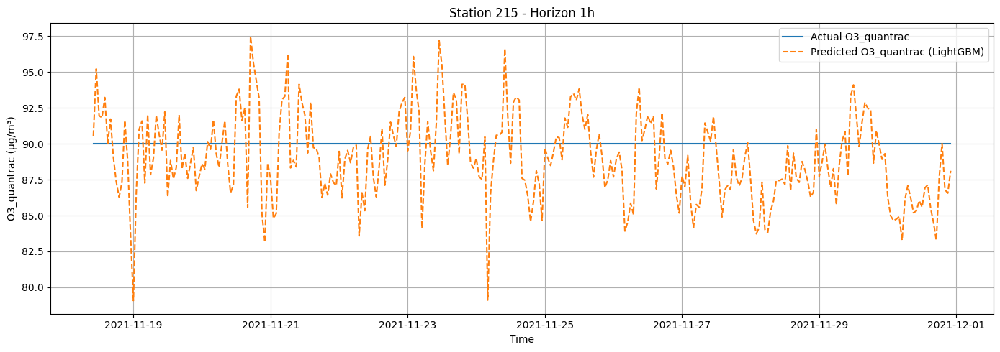

hour = 24


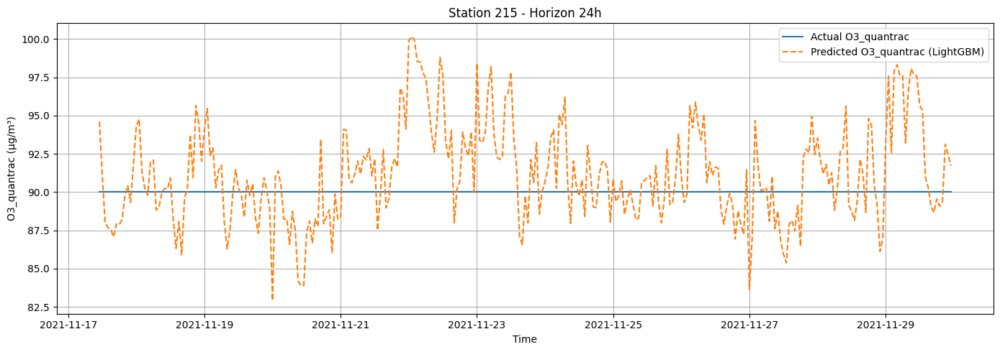

hour = 48


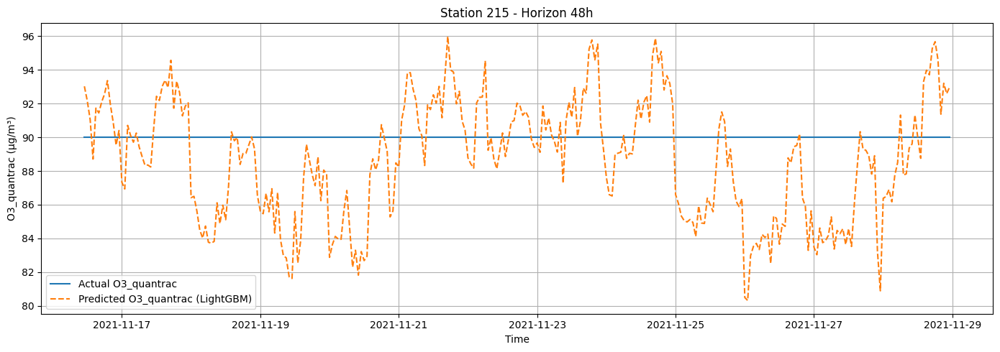

hour = 72


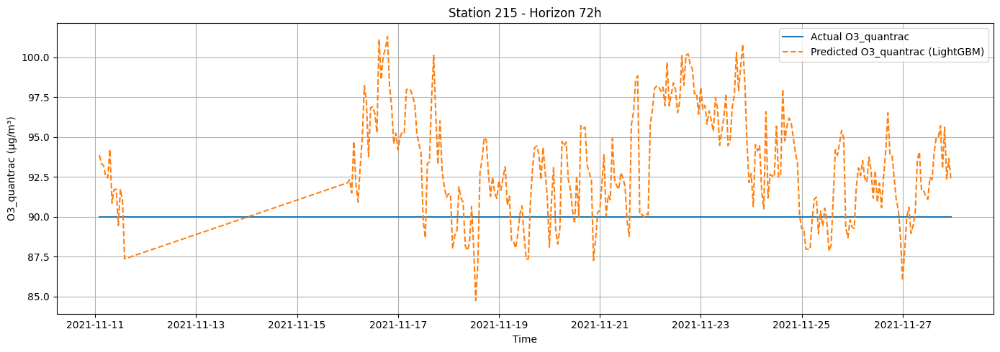

station_id = 216
hour = 1


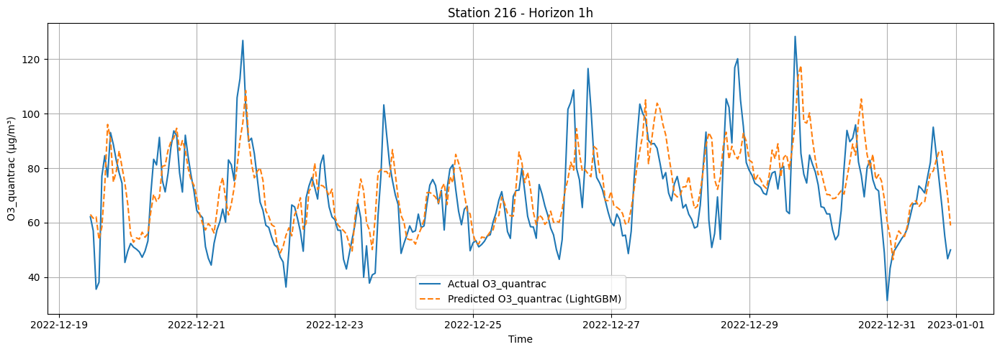

hour = 24


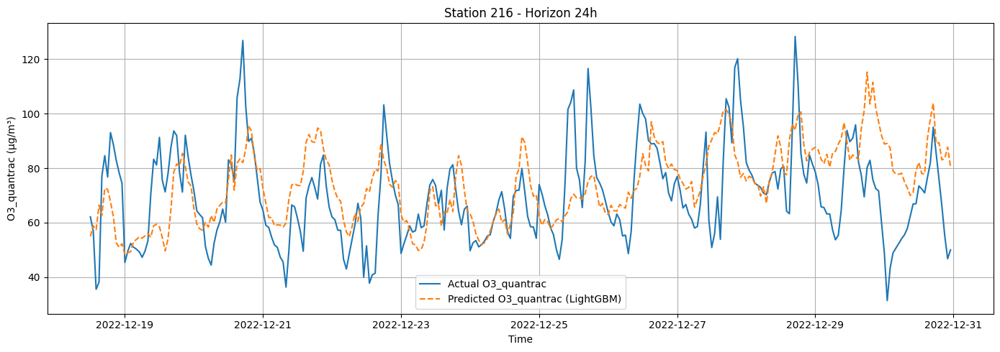

hour = 48


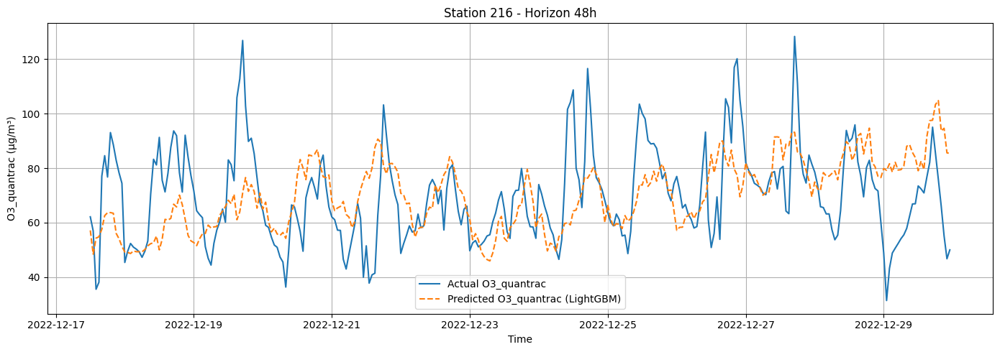

hour = 72


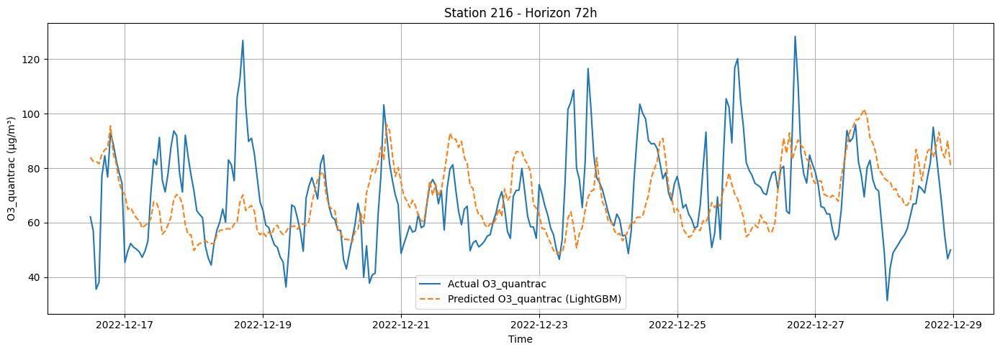

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)

## Training for CO

In [21]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
#co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
co_df_metrics_all.drop(columns=["n_samples"]).to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====
len(X) = 38542
len(y) = 38542
Number of features: 40
Features:
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll6_mean
CO_quantrac_roll6_std
CO_quantrac_roll12_mean
CO_quantrac_roll12_std
CO_quantrac_roll24_mean
CO_quantrac_roll24_std
X_train: (26976, 40)
y_train: (26976, 1)
X_val: (5782, 40)
y_val: (5782, 1)
X_test: (5784, 40)
y_test: 

,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples
0,211,1,51.47,41.45,5.56,0.03,0.55,588
6,211,24,66.83,51.50,6.86,-0.02,0.10,585
12,211,48,61.86,47.75,6.44,-0.05,0.11,581
18,211,72,138.12,119.16,16.05,-0.16,0.25,577
1,212,1,33.46,26.30,26.61,0.03,0.24,875
7,212,24,126.84,112.79,124.31,-1.24,0.03,871
13,212,48,138.12,107.91,114.61,-1.15,-0.07,867
19,212,72,225.25,175.12,189.67,-1.90,-0.03,864
2,213,1,413.04,302.90,70.03,-0.46,0.46,887
8,213,24,485.00,355.45,74.66,-0.45,0.17,884


station_id = 211
hour = 1


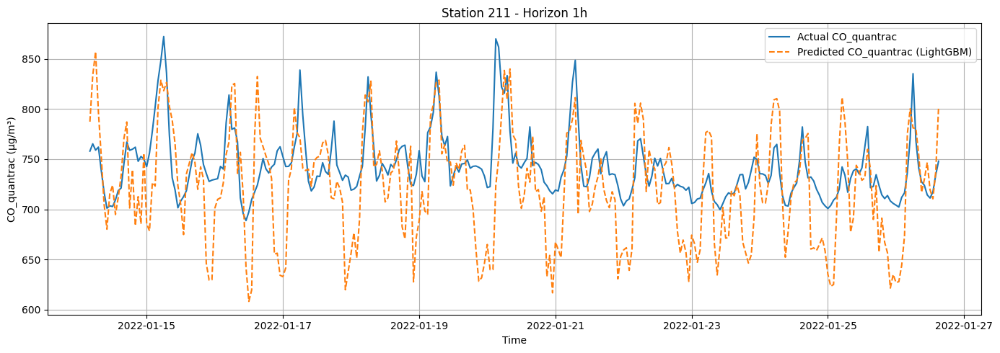

hour = 24


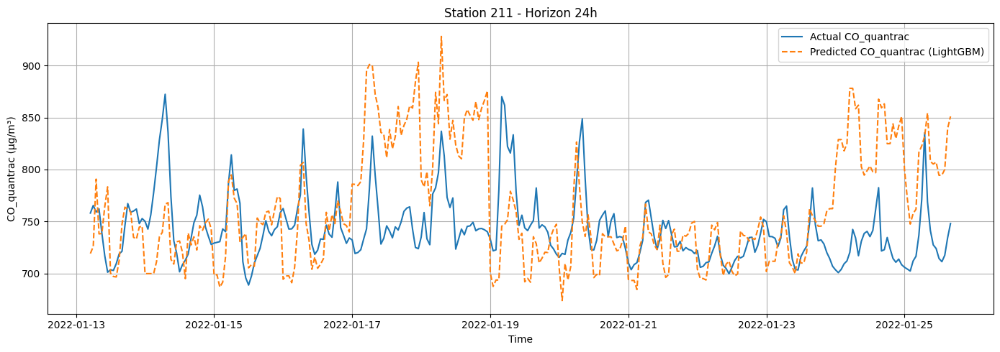

hour = 48


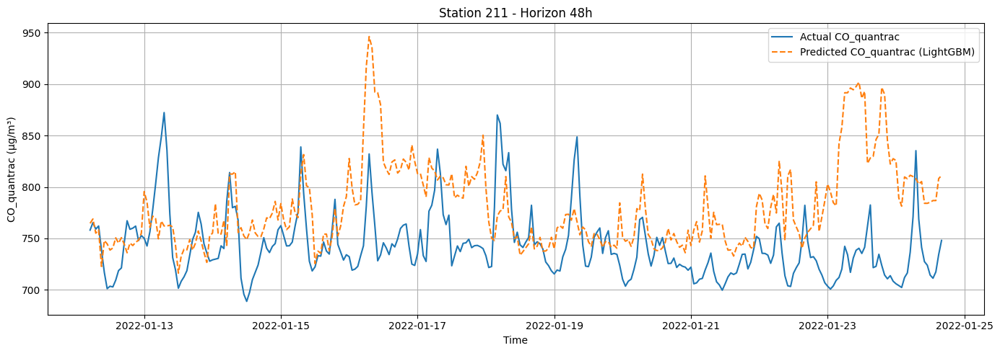

hour = 72


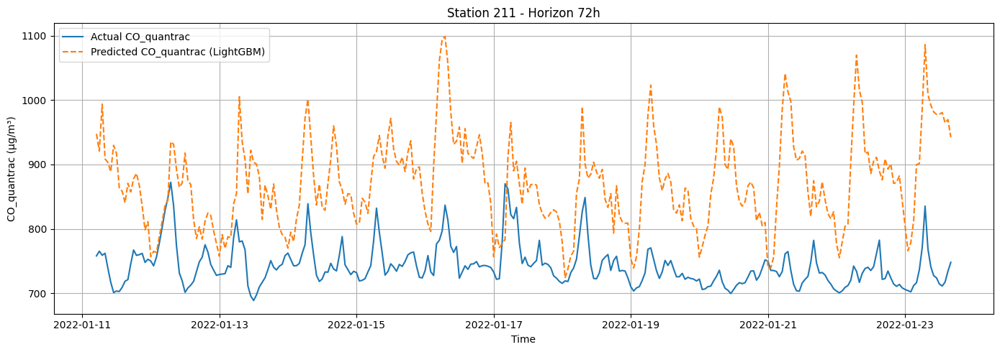

station_id = 212
hour = 1


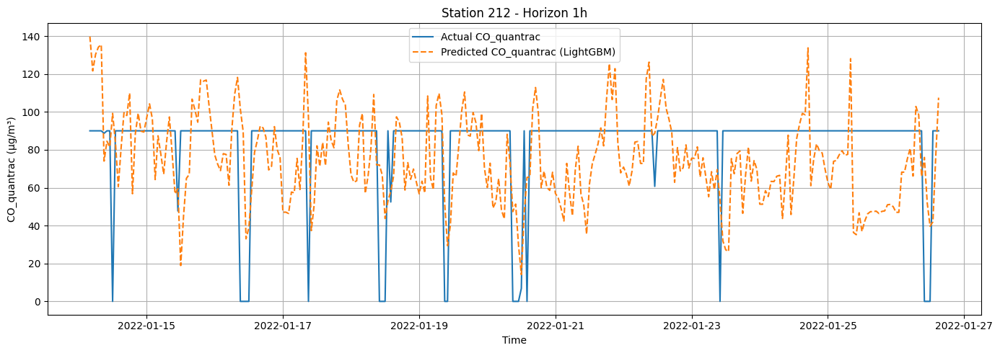

hour = 24


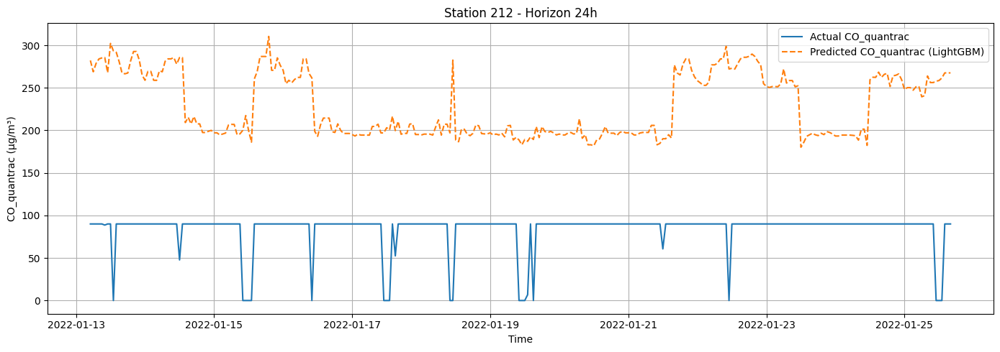

hour = 48


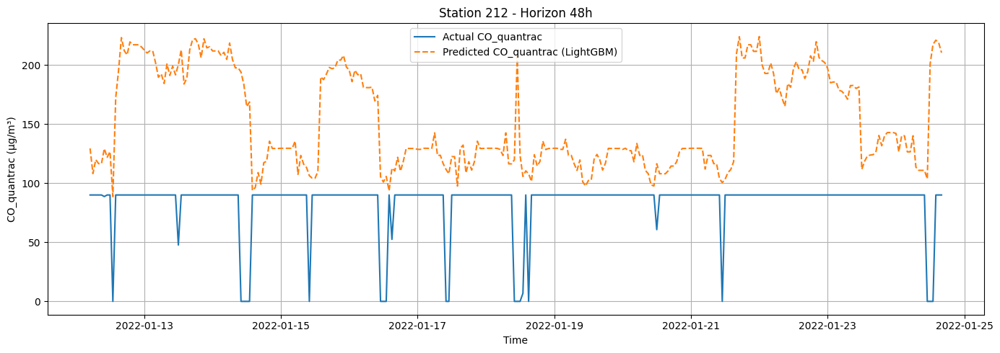

hour = 72


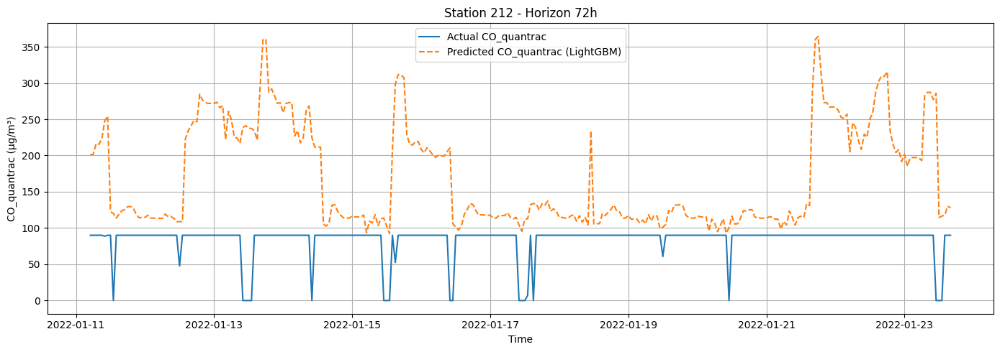

station_id = 213
hour = 1


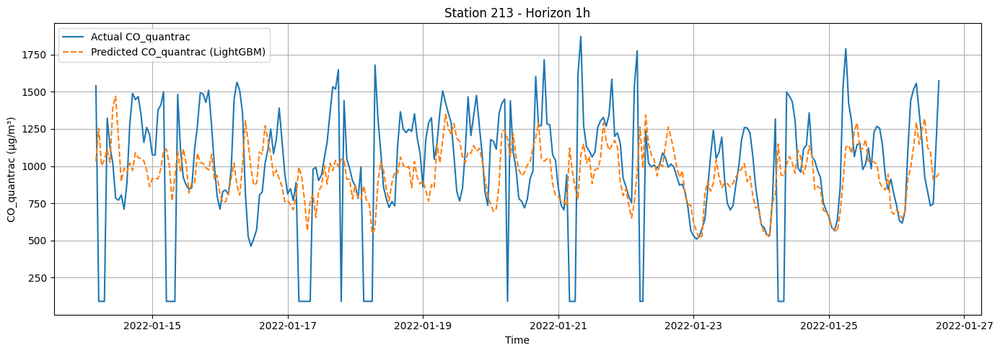

hour = 24


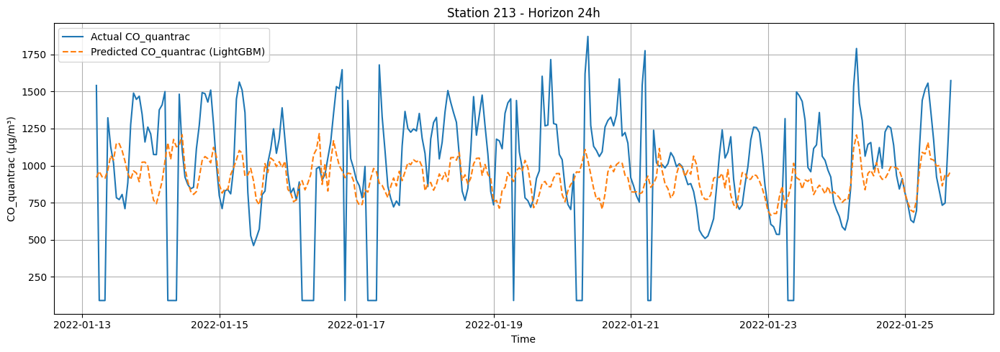

hour = 48


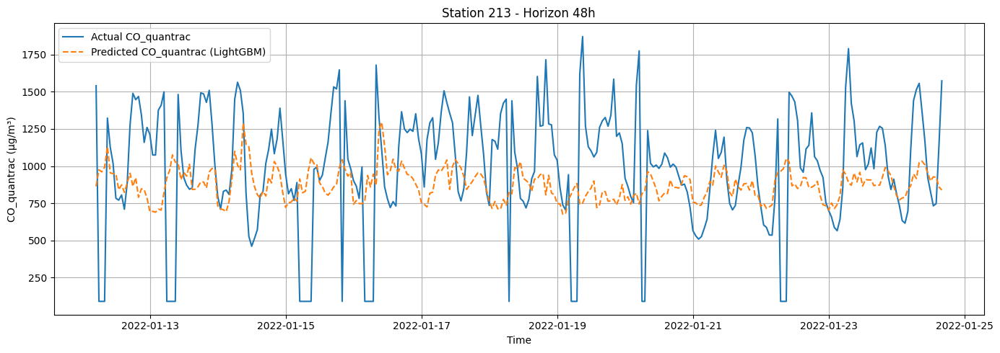

hour = 72


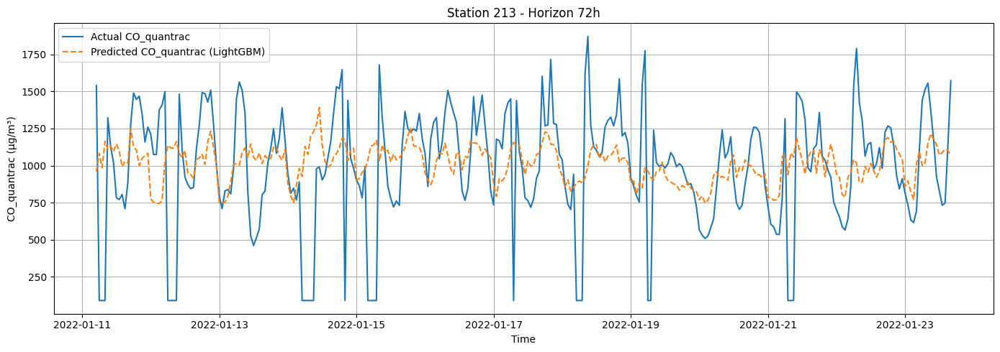

station_id = 214
hour = 1


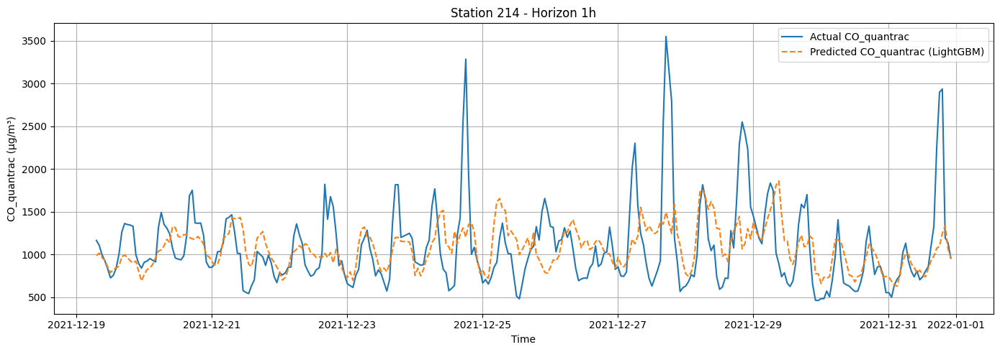

hour = 24


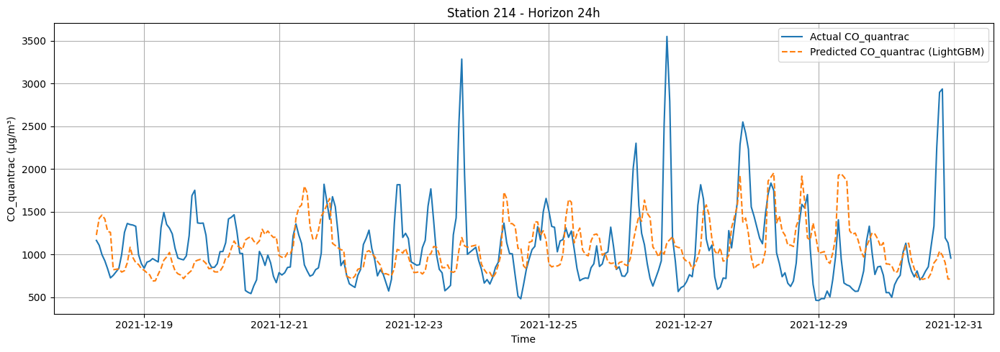

hour = 48


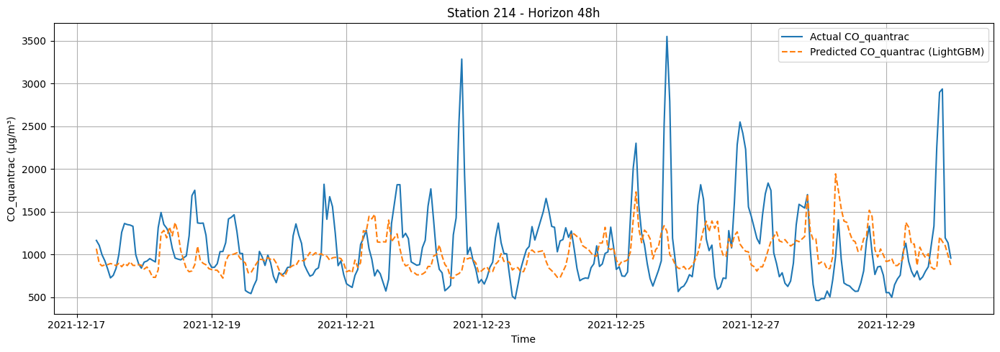

hour = 72


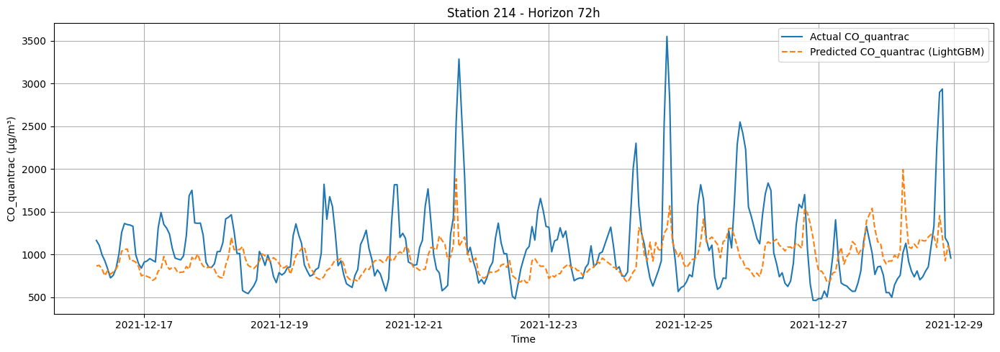

station_id = 215
hour = 1


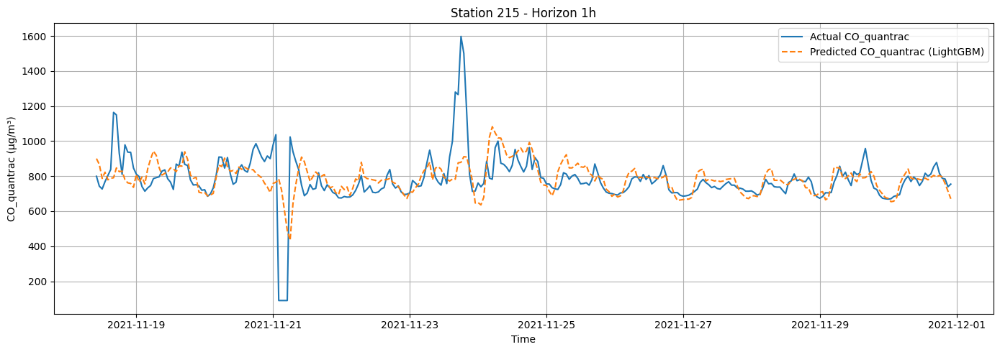

hour = 24


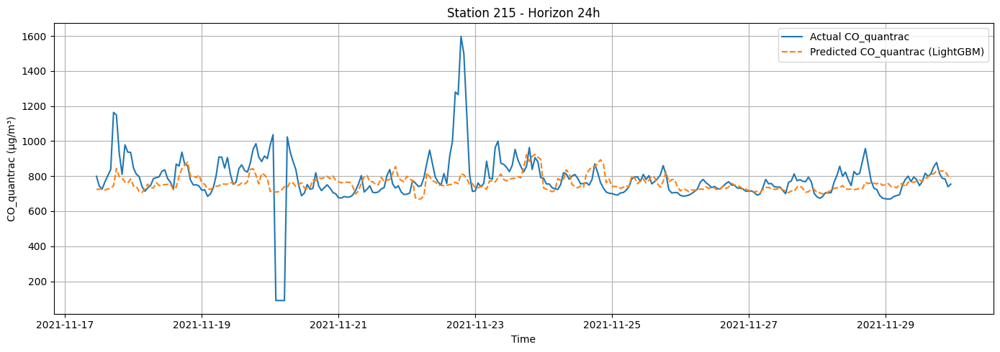

hour = 48


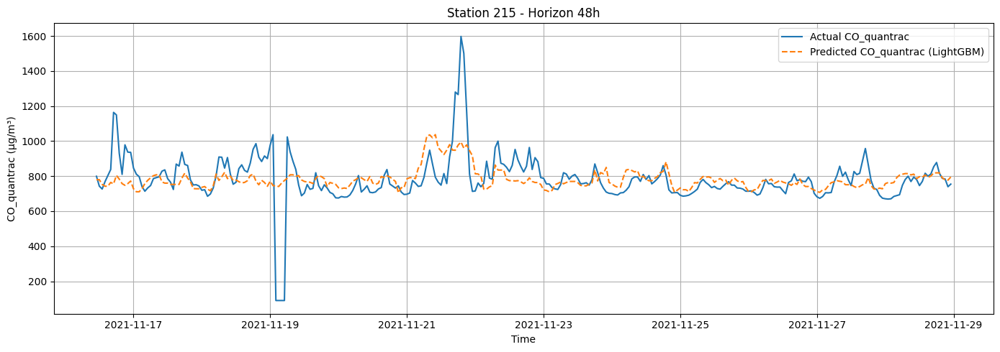

hour = 72


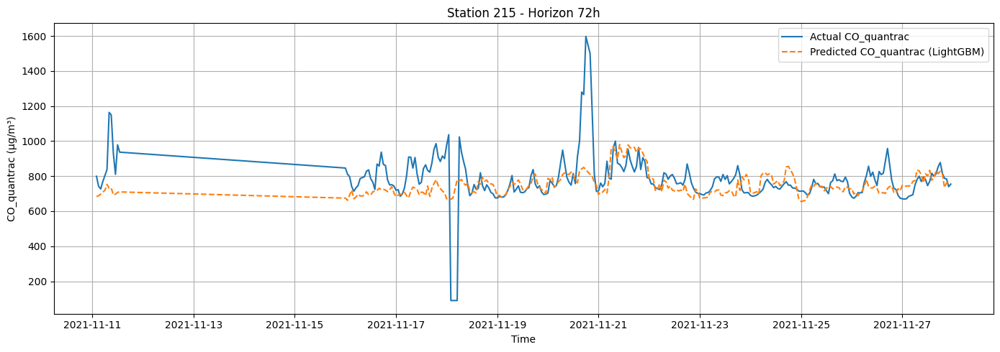

station_id = 216
hour = 1


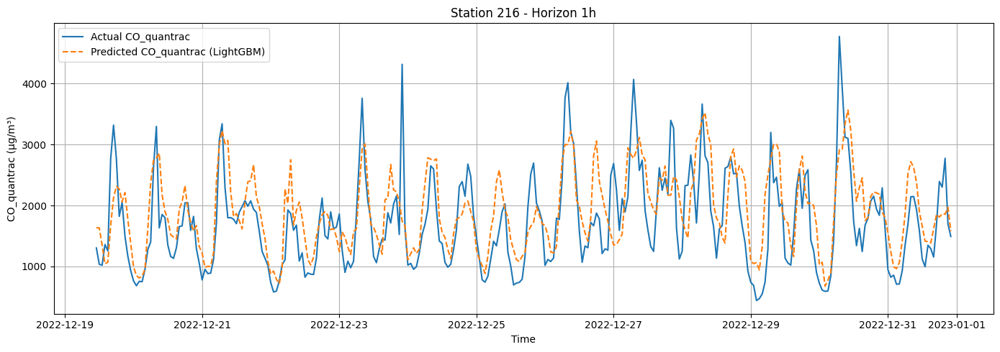

hour = 24


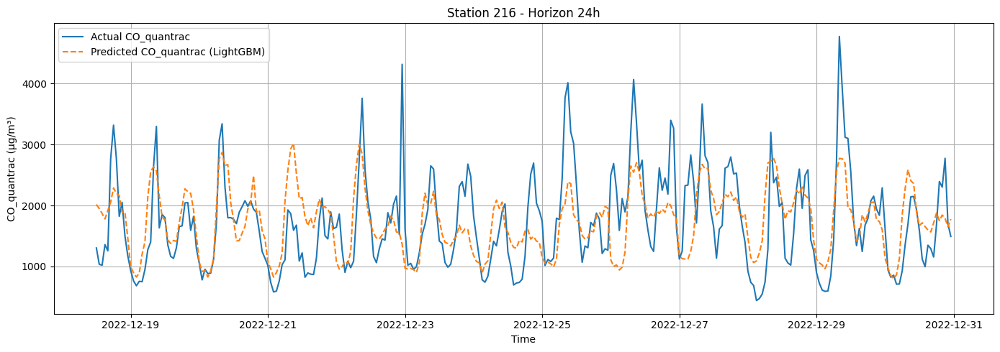

hour = 48


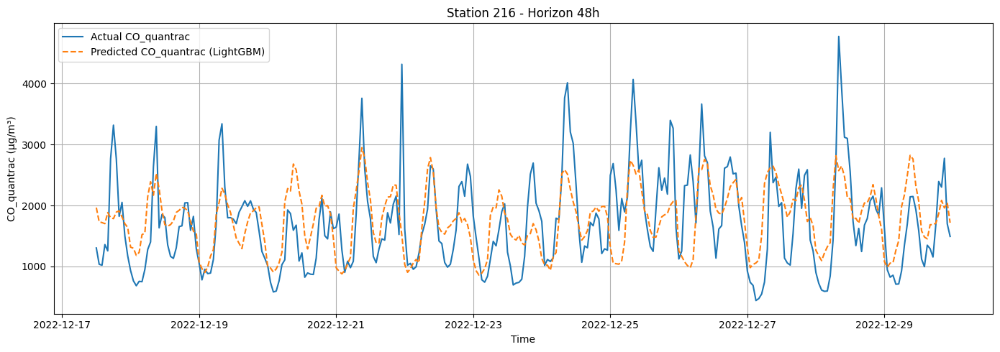

hour = 72


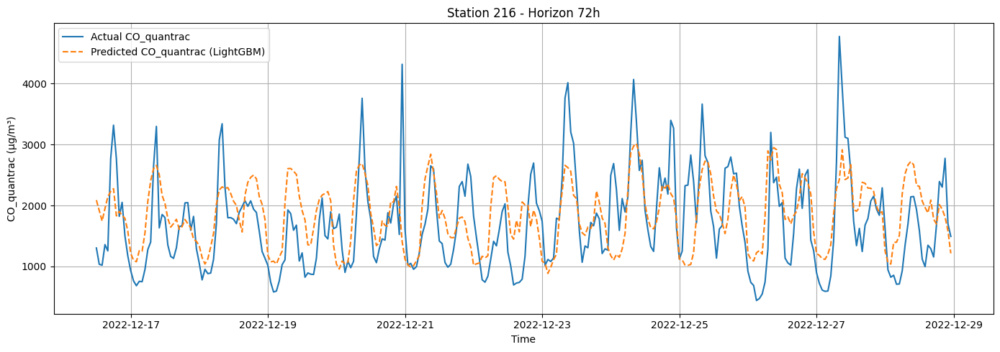

In [22]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)